# Home Credit Default Risk (HCDR)

The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg uncompressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data


# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview
There are 7 different sources of data:

* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [1]:
# ![alt](home_credit.png "Home credit")

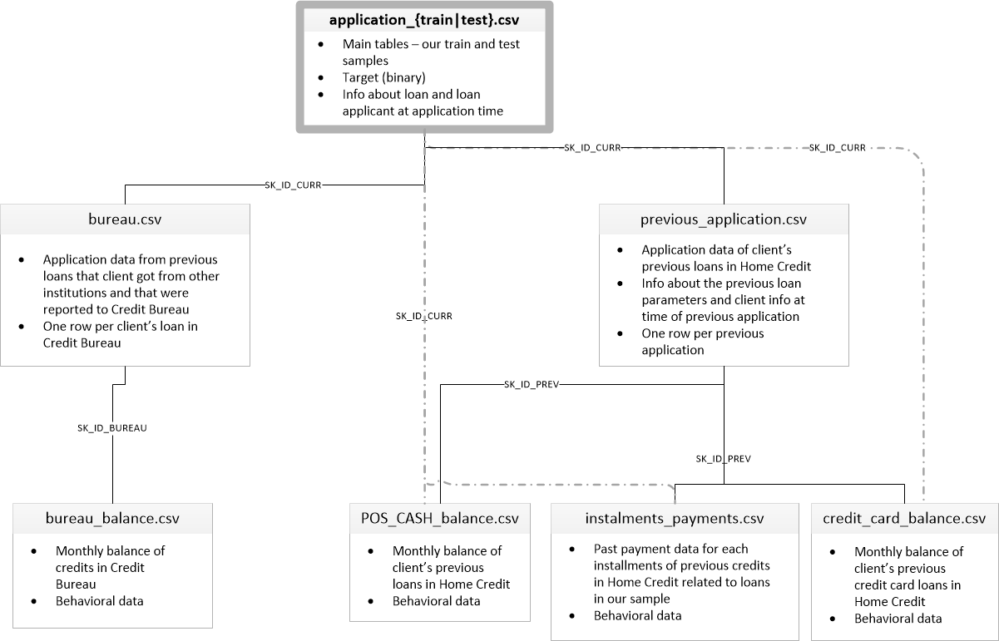

## Downloading the files to local

Create a base directory:

```bash
DATA_DIR = "../Data/"  
```


### Imports

In [2]:
# import packages

import os
import time
import warnings
import zipfile
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from pandas.plotting import scatter_matrix
import missingno as msno
#pip install msno

warnings.filterwarnings('ignore')


In [3]:
!pwd

/Users/pragatwagle/Desktop/aml hw's/AML556FinalProjectFall2022/Phase2


### Loadig Data

Creating dictionary for datasets so that we can keep track of datsets and also make them callable to functions.

In [4]:
# load data

DATA_DIR =  "/../Data/"

ds_names = ("application_train", "application_test", "bureau",
            "credit_card_balance", "installments_payments","previous_application",
            "POS_CASH_balance")

datasets = {}
datasets_transformed = {}

for ds_name in ds_names:
    datasets[ds_name] = pd.read_csv(os.getcwd() + DATA_DIR + f'{ds_name}.csv')

In case reading zip files, we can use below code to unzip files are read them.

In [5]:
unzippingReq = False
if unzippingReq: #please modify this code 
    zip_ref = zipfile.ZipFile('application_train.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('application_test.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('credit_card_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('installments_payments.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('POS_CASH_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('previous_application.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()

## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It is named `HomeCredit_columns_description.csv`

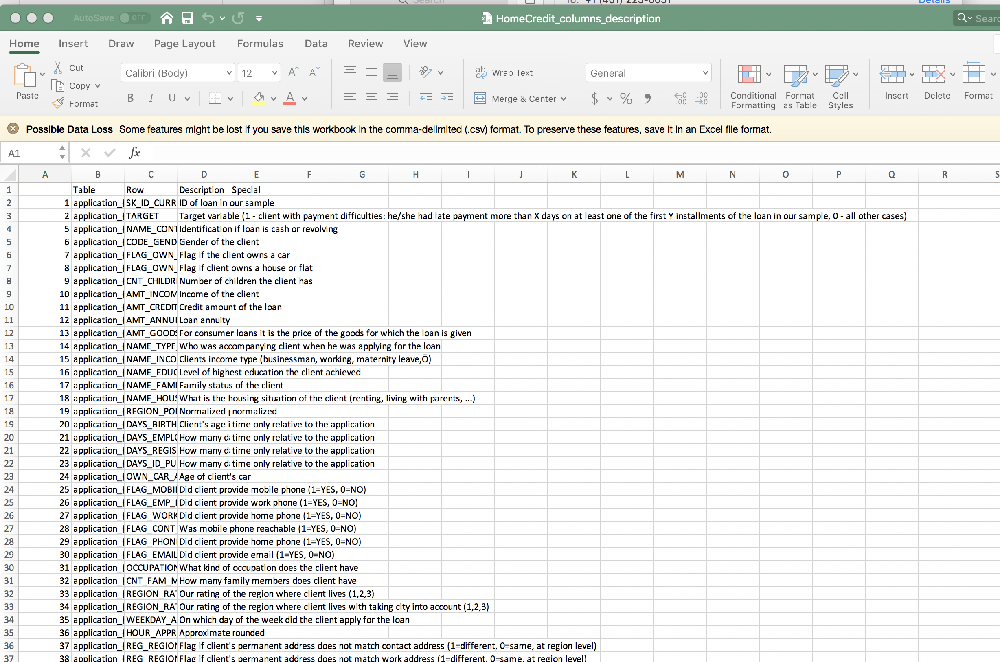

### Application train

In [5]:
def load_data(df,name):
    #df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df

ds_name = 'application_train'
datasets[ds_name]= load_data(datasets[ds_name],ds_name)

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [6]:
ds_name = 'application_test'
datasets[ds_name]= load_data(datasets[ds_name],ds_name)

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


The application dataset has the most information about the client: Gender, Income, Family Status, Education, and others.

### The Other Datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about previous credits in bureau. Each row is one month of a previous credit and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application train data. Each current loan in the application train data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan and a single previous loan can have many rows.
* __Credit_card_balance:__ monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [7]:
%%time
ds_names = ("application_train", "application_test", "bureau","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
    datasets[ds_name] = load_data(datasets[ds_name], ds_name)


application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


credit_card_balance: shape is (3840312, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_C

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


installments_payments: shape is (13605401, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


POS_CASH_balance: shape is (10001358, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


CPU times: user 1.14 s, sys: 165 ms, total: 1.31 s
Wall time: 1.48 s


In [8]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')

dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


# Exploratory Data Analysis

## EDA Functions

### Summary Function - All tables

A summary of each table is provided using the described function below. Summary statistics will show statistics on each dataframe and through that meaningful interpretations were made about the data to further plan EDA on each dataset.

__Function Feature Summary:__

This function will take a dataframe as input and provide summary statistics for the table. This generic function will help us evaluate each table with just one line of code, improving the reusablity of the code. 

Function name: feature_summary                                                     Input : Dataframe     Output : Dataframe Summary

Function output:
1. Provide table name for which analysis in progress.
2. Shape - provides rows and columns in the data set.
3. NULLS - Number of nulls in the column.
4. %_NULL - NULL percentage. (nulls/attributes count).
5. Unique values - No of unique values for the feature.
6. Data Type - Id column numerical or categorical.
7. Max/Min - Max and min for the column. This provides idea about scale. helps if need log transformation.
8. Mean - Mean of the attribute.
9. Std - Standard Deviation of the atttibute.
10. Skewness - Skewness, data distribution of transformations.
11. Sample values - Sample values for the attribute.


In [9]:
def feature_summary(df_fa):
    print('DataFrame shape')
    print('Rows:',df_fa.shape[0])
    print('Cols:',df_fa.shape[1])
    print("------------------------------------------------------------------------")
    
    col_list=['Null','%_Null','Unique_Count','Data_type','Max/Min','Mean','Std','Skewness','Sample_values']
    df=pd.DataFrame(index=df_fa.columns,columns=col_list)
    df['Null']=list([len(df_fa[col][df_fa[col].isnull()]) for i,col in enumerate(df_fa.columns)])
    df['%_Null']=round((df_fa.isnull().sum()/df_fa.isnull().count()*100),3).sort_values(ascending = False)
    df['Unique_Count']=list([len(df_fa[col].unique()) for i,col in enumerate(df_fa.columns)])
    df['Data_type']=list([df_fa[col].dtype for i,col in enumerate(df_fa.columns)])
    for i,col in enumerate(df_fa.columns):
        if 'float' in str(df_fa[col].dtype) or 'int' in str(df_fa[col].dtype):
            df.at[col,'Max/Min']=str(round(df_fa[col].max(),2))+'/'+str(round(df_fa[col].min(),2))
            df.at[col,'Mean']=df_fa[col].mean()
            df.at[col,'Std']=df_fa[col].std()
            df.at[col,'Skewness']=df_fa[col].skew()
        df.at[col,'Sample_values']=list(df_fa[col].unique())
    print("Table Statistics")
    print("------------------------------------------------------------------------")
    display(df.fillna('-'))

In [10]:
for i,ds_name in enumerate(datasets.keys()):
    print("Table under consideration:",ds_name.upper())
    print("------------------------------------------------------------------------")
    ds = feature_summary(datasets[ds_name])
    print("------------------------------------------------------------------------")

Table under consideration: APPLICATION_TRAIN
------------------------------------------------------------------------
DataFrame shape
Rows: 307511
Cols: 122
------------------------------------------------------------------------
Table Statistics
------------------------------------------------------------------------


,Null,%_Null,Unique_Count,Data_type,Max/Min,Mean,Std,Skewness,Sample_values
SK_ID_CURR,0,0.000,307511,int64,456255/100002,278180.518577,102790.175348,-0.0012,"[100002, 100003, 100004, 100006, 100007, 10000..."
TARGET,0,0.000,2,int64,1/0,0.080729,0.272419,3.078159,"[1, 0]"
NAME_CONTRACT_TYPE,0,0.000,2,object,-,-,-,-,"[Cash loans, Revolving loans]"
CODE_GENDER,0,0.000,3,object,-,-,-,-,"[M, F, XNA]"
FLAG_OWN_CAR,0,0.000,2,object,-,-,-,-,"[N, Y]"
...,...,...,...,...,...,...,...,...,...
AMT_REQ_CREDIT_BUREAU_DAY,41519,13.502,10,float64,9.0/0.0,0.007,0.110757,27.043505,"[0.0, nan, 1.0, 3.0, 2.0, 4.0, 5.0, 6.0, 9.0, ..."
AMT_REQ_CREDIT_BUREAU_WEEK,41519,13.502,10,float64,8.0/0.0,0.034362,0.204685,9.293573,"[0.0, nan, 1.0, 3.0, 2.0, 4.0, 5.0, 6.0, 8.0, ..."
AMT_REQ_CREDIT_BUREAU_MON,41519,13.502,25,float64,27.0/0.0,0.267395,0.916002,7.804848,"[0.0, nan, 1.0, 2.0, 6.0, 5.0, 3.0, 7.0, 9.0, ..."
AMT_REQ_CREDIT_BUREAU_QRT,41519,13.502,12,float64,261.0/0.0,0.265474,0.794056,134.365776,"[0.0, nan, 1.0, 2.0, 4.0, 3.0, 8.0, 5.0, 6.0, ..."


------------------------------------------------------------------------
Table under consideration: APPLICATION_TEST
------------------------------------------------------------------------
DataFrame shape
Rows: 48744
Cols: 121
------------------------------------------------------------------------
Table Statistics
------------------------------------------------------------------------


,Null,%_Null,Unique_Count,Data_type,Max/Min,Mean,Std,Skewness,Sample_values
SK_ID_CURR,0,0.00,48744,int64,456250/100001,277796.67635,103169.547296,0.00756,"[100001, 100005, 100013, 100028, 100038, 10004..."
NAME_CONTRACT_TYPE,0,0.00,2,object,-,-,-,-,"[Cash loans, Revolving loans]"
CODE_GENDER,0,0.00,2,object,-,-,-,-,"[F, M]"
FLAG_OWN_CAR,0,0.00,2,object,-,-,-,-,"[N, Y]"
FLAG_OWN_REALTY,0,0.00,2,object,-,-,-,-,"[Y, N]"
...,...,...,...,...,...,...,...,...,...
AMT_REQ_CREDIT_BUREAU_DAY,6049,12.41,4,float64,2.0/0.0,0.001803,0.046132,28.273838,"[0.0, nan, 1.0, 2.0]"
AMT_REQ_CREDIT_BUREAU_WEEK,6049,12.41,4,float64,2.0/0.0,0.002787,0.054037,20.182271,"[0.0, nan, 1.0, 2.0]"
AMT_REQ_CREDIT_BUREAU_MON,6049,12.41,8,float64,6.0/0.0,0.009299,0.110924,17.270891,"[0.0, nan, 1.0, 3.0, 2.0, 6.0, 4.0, 5.0]"
AMT_REQ_CREDIT_BUREAU_QRT,6049,12.41,9,float64,7.0/0.0,0.546902,0.693305,1.254612,"[0.0, 1.0, nan, 3.0, 2.0, 4.0, 5.0, 7.0, 6.0]"


------------------------------------------------------------------------
Table under consideration: BUREAU
------------------------------------------------------------------------
DataFrame shape
Rows: 1716428
Cols: 17
------------------------------------------------------------------------
Table Statistics
------------------------------------------------------------------------


,Null,%_Null,Unique_Count,Data_type,Max/Min,Mean,Std,Skewness,Sample_values
SK_ID_CURR,0,0.000,305811,int64,456255/100001,278214.933645,102938.558112,0.001063,"[215354, 162297, 402440, 238881, 222183, 42615..."
SK_ID_BUREAU,0,0.000,1716428,int64,6843457/5000000,5924434.489032,532265.728552,-0.007498,"[5714462, 5714463, 5714464, 5714465, 5714466, ..."
CREDIT_ACTIVE,0,0.000,4,object,-,-,-,-,"[Closed, Active, Sold, Bad debt]"
CREDIT_CURRENCY,0,0.000,4,object,-,-,-,-,"[currency 1, currency 2, currency 4, currency 3]"
DAYS_CREDIT,0,0.000,2923,int64,0/-2922,-1142.107685,795.164928,-0.582349,"[-497, -208, -203, -629, -273, -43, -1896, -11..."
CREDIT_DAY_OVERDUE,0,0.000,942,int64,2792/0,0.818167,36.544428,55.931005,"[0, 2603, 6, 30, 2156, 496, 186, 2264, 41, 8, ..."
DAYS_CREDIT_ENDDATE,105553,6.150,14097,float64,31199.0/-42060.0,510.517362,4994.219837,5.127134,"[-153.0, 1075.0, 528.0, nan, 1197.0, 27460.0, ..."
DAYS_ENDDATE_FACT,633653,36.917,2918,float64,0.0/-42023.0,-1017.437148,714.010626,-0.774754,"[-153.0, nan, -1710.0, -840.0, -825.0, -187.0,..."
AMT_CREDIT_MAX_OVERDUE,1124488,65.513,68252,float64,115987185.0/0.0,3825.417661,206031.606207,470.913819,"[nan, 77674.5, 0.0, 14985.0, 310.5, 20493.27, ..."
CNT_CREDIT_PROLONG,0,0.000,10,int64,9/0,0.00641,0.096224,20.319277,"[0, 2, 1, 4, 3, 5, 9, 8, 6, 7]"


------------------------------------------------------------------------
Table under consideration: CREDIT_CARD_BALANCE
------------------------------------------------------------------------
DataFrame shape
Rows: 3840312
Cols: 23
------------------------------------------------------------------------
Table Statistics
------------------------------------------------------------------------


,Null,%_Null,Unique_Count,Data_type,Max/Min,Mean,Std,Skewness,Sample_values
SK_ID_PREV,0,0.000,104307,int64,2843496/1000018,1904503.5899,536469.470563,0.038385,"[2562384, 2582071, 1740877, 1389973, 1891521, ..."
SK_ID_CURR,0,0.000,103558,int64,456250/100006,278324.207289,102704.475133,-0.001834,"[378907, 363914, 371185, 337855, 126868, 38001..."
MONTHS_BALANCE,0,0.000,96,int64,-1/-96,-34.521921,26.667751,-0.59804,"[-6, -1, -7, -4, -5, -3, -2, -19, -13, -18, -1..."
AMT_BALANCE,0,0.000,1347904,float64,1505902.19/-420250.18,58300.155262,106307.031025,2.920173,"[56.97, 63975.555, 31815.225, 236572.11, 45391..."
AMT_CREDIT_LIMIT_ACTUAL,0,0.000,181,int64,1350000/0,153807.9574,165145.699523,2.059732,"[135000, 45000, 450000, 225000, 270000, 585000..."
AMT_DRAWINGS_ATM_CURRENT,749816,19.525,2268,float64,2115000.0/-6827.31,5961.324822,28225.688579,9.664842,"[0.0, 2250.0, 67500.0, 45000.0, 90000.0, 76500..."
AMT_DRAWINGS_CURRENT,0,0.000,187005,float64,2287098.31/-6211.62,7433.388179,33846.077334,10.065626,"[877.5, 2250.0, 0.0, 11547.0, 67500.0, 45000.0..."
AMT_DRAWINGS_OTHER_CURRENT,749816,19.525,1833,float64,1529847.0/0.0,288.169582,8201.989345,50.57035,"[0.0, 137700.0, nan, 177840.0, 46800.0, 187200..."
AMT_DRAWINGS_POS_CURRENT,749816,19.525,168749,float64,2239274.16/0.0,2968.804848,20796.887047,19.421081,"[877.5, 0.0, 11547.0, 199339.425, 34526.7, 968..."
AMT_INST_MIN_REGULARITY,305236,7.948,312267,float64,202882.01/0.0,3540.204129,5600.154122,2.494431,"[1700.325, 2250.0, 11795.76, 22924.89, 4449.10..."


------------------------------------------------------------------------
Table under consideration: INSTALLMENTS_PAYMENTS
------------------------------------------------------------------------
DataFrame shape
Rows: 13605401
Cols: 8
------------------------------------------------------------------------
Table Statistics
------------------------------------------------------------------------


,Null,%_Null,Unique_Count,Data_type,Max/Min,Mean,Std,Skewness,Sample_values
SK_ID_PREV,0,0.000,997752,int64,2843499/1000001,1.903365e+06,536202.905546,0.042510,"[1054186, 1330831, 2085231, 2452527, 2714724, ..."
SK_ID_CURR,0,0.000,339587,int64,456255/100001,2.784449e+05,102718.310411,-0.003354,"[161674, 151639, 193053, 199697, 167756, 16448..."
NUM_INSTALMENT_VERSION,0,0.000,65,float64,178.0/0.0,8.566373e-01,1.035216,9.593395,"[1.0, 0.0, 2.0, 4.0, 3.0, 5.0, 7.0, 8.0, 6.0, ..."
NUM_INSTALMENT_NUMBER,0,0.000,277,int64,277/1,1.887090e+01,26.664067,2.497597,"[6, 34, 1, 3, 2, 12, 11, 4, 14, 8, 20, 56, 7, ..."
DAYS_INSTALMENT,0,0.000,2922,float64,-1.0/-2922.0,-1.042270e+03,800.946284,-0.628704,"[-1180.0, -2156.0, -63.0, -2418.0, -1383.0, -1..."
DAYS_ENTRY_PAYMENT,2905,0.021,3040,float64,-1.0/-4921.0,-1.051114e+03,800.585883,-0.626889,"[-1187.0, -2156.0, -63.0, -2426.0, -1366.0, -1..."
AMT_INSTALMENT,0,0.000,902539,float64,3771487.85/0.0,1.705091e+04,50570.254429,16.235905,"[6948.36, 1716.525, 25425.0, 24350.13, 2165.04..."
AMT_PAYMENT,2905,0.021,944236,float64,3771487.85/0.0,1.723822e+04,54735.783981,14.951925,"[6948.36, 1716.525, 25425.0, 24350.13, 2160.58..."


------------------------------------------------------------------------
Table under consideration: PREVIOUS_APPLICATION
------------------------------------------------------------------------
DataFrame shape
Rows: 1670214
Cols: 37
------------------------------------------------------------------------
Table Statistics
------------------------------------------------------------------------


,Null,%_Null,Unique_Count,Data_type,Max/Min,Mean,Std,Skewness,Sample_values
SK_ID_PREV,0,0.000,1670214,int64,2845382/1000001,1923089.135331,532597.958696,-0.000573,"[2030495, 2802425, 2523466, 2819243, 1784265, ..."
SK_ID_CURR,0,0.000,338857,int64,456255/100001,278357.174099,102814.823849,-0.003303,"[271877, 108129, 122040, 176158, 202054, 19938..."
NAME_CONTRACT_TYPE,0,0.000,4,object,-,-,-,-,"[Consumer loans, Cash loans, Revolving loans, ..."
AMT_ANNUITY,372235,22.287,357960,float64,418058.15/0.0,15955.120659,14782.137335,2.692572,"[1730.43, 25188.615, 15060.735, 47041.335, 319..."
AMT_APPLICATION,0,0.000,93885,float64,6905160.0/0.0,175233.86036,292779.762387,3.391442,"[17145.0, 607500.0, 112500.0, 450000.0, 337500..."
AMT_CREDIT,1,0.000,86804,float64,6905160.0/0.0,196114.021218,318574.616546,3.245815,"[17145.0, 679671.0, 136444.5, 470790.0, 404055..."
AMT_DOWN_PAYMENT,895844,53.636,29279,float64,3060045.0/-0.9,6697.402139,20921.49541,36.476576,"[0.0, nan, 12649.5, 1350.0, 9000.0, 13500.0, 4..."
AMT_GOODS_PRICE,385515,23.082,93886,float64,6905160.0/0.0,227847.279283,315396.557937,3.07369,"[17145.0, 607500.0, 112500.0, 450000.0, 337500..."
WEEKDAY_APPR_PROCESS_START,0,0.000,7,object,-,-,-,-,"[SATURDAY, THURSDAY, TUESDAY, MONDAY, FRIDAY, ..."
HOUR_APPR_PROCESS_START,0,0.000,24,int64,23/0,12.484182,3.334028,-0.025629,"[15, 11, 7, 9, 8, 10, 12, 13, 14, 16, 6, 4, 5,..."


------------------------------------------------------------------------
Table under consideration: POS_CASH_BALANCE
------------------------------------------------------------------------
DataFrame shape
Rows: 10001358
Cols: 8
------------------------------------------------------------------------
Table Statistics
------------------------------------------------------------------------


,Null,%_Null,Unique_Count,Data_type,Max/Min,Mean,Std,Skewness,Sample_values
SK_ID_PREV,0,0.000,936325,int64,2843499/1000001,1903216.598957,535846.530722,0.044229,"[1803195, 1715348, 1784872, 1903291, 2341044, ..."
SK_ID_CURR,0,0.000,337252,int64,456255/100001,278403.863306,102763.74509,-0.003128,"[182943, 367990, 397406, 269225, 334279, 34216..."
MONTHS_BALANCE,0,0.000,96,int64,-1/-96,-35.012588,26.06657,-0.672777,"[-31, -33, -32, -35, -38, -39, -34, -41, -37, ..."
CNT_INSTALMENT,26071,0.261,74,float64,92.0/1.0,17.08965,11.995056,1.601734,"[48.0, 36.0, 12.0, 24.0, 60.0, 18.0, 4.0, 42.0..."
CNT_INSTALMENT_FUTURE,26087,0.261,80,float64,85.0/0.0,10.48384,11.109058,1.846746,"[45.0, 35.0, 9.0, 42.0, 12.0, 43.0, 36.0, 16.0..."
NAME_CONTRACT_STATUS,0,0.000,9,object,-,-,-,-,"[Active, Completed, Signed, Approved, Returned..."
SK_DPD,0,0.000,3400,int64,4231/0,11.606928,132.714043,14.899126,"[0, 1, 2, 4, 3, 18, 7, 5, 12, 6, 8, 13, 16, 10..."
SK_DPD_DEF,0,0.000,2307,int64,3595/0,0.654468,32.762491,66.339906,"[0, 1, 2, 4, 3, 18, 7, 5, 12, 8, 13, 10, 15, 6..."


------------------------------------------------------------------------


### Feature extraction based on Type


__Function id_num_cat_feature:__

This function will take a dataframe as input and return 4 lists that contain ID columns, numerical features, categorical features, and numerical features without the ID cols. 

Function name: id_num_cat_feature
Input : Dataframe
Output : 4 Lists

Function output:
1. ID columns
2. Numerical features
3. Categorical features
4. Numerical features excluding the ID columns.


Using this function gives us mutiple lists of the column types which are then used in other functions. The function returns clear separations on what columns are categorical and numerical. By having the distinctive categorical columns and numerical columns lists, different transformations are performed on them based on if they are categorical or numerical.

In [11]:
def id_num_cat_feature(df):
    numerical = df.select_dtypes(include=['int64', 'float64']).columns
    categorical = df.select_dtypes(include=['object', 'bool']).columns
    feat_num = list(numerical)
    feat_cat = list(categorical)
    
    id_cols = ['SK_ID_CURR','SK_ID_BUREAU']
    
    id_cols = [cols for cols in  list(df.columns.intersection(id_cols))] 
    features = list(set(df.columns) - set(id_cols))
    
    print('--------')
    print(f"# of ID's: {len(id_cols)}")
    print(f" ID's: {id_cols}")
    print('--------')
    print(f"# of numerical   features: {len(feat_num)}")
    print(f"Numerical   features: {feat_num}")
    print('--------')
    print(f"# of categorical features: {len(feat_cat)}")
    print(f"Categorical features: {feat_cat}")
    print('--------')
    print(f"# All features: {len(features)}")
    print(f"All features: {features}")
    return id_cols,feat_num,feat_cat,features

### Missing Count and percentage


__Function missing_data:__

This function will take a dataframe as input and provide null count and % of nulls for a dataframe.

Function name: missing_data
Input : Dataframe
Output : NULL count and NULL %

Function output:
1. NULL Count
2. NULL Percentage.

In [12]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent']) 

### Feature Engineering 

__Class:__ FeatureSummarizer


Class FeatureSummarizer has following aggregation parameters:
1. "min"
2. "max"
3. "count"
4. "sum"
5. "median"
6. "mean"
7. "var"

Based on the keys of the dataframe, transformation function will enable grouping of feature variables on ID and then aggregate the feature variables into their predefined statistical summaries for each grouping.

__Function:__ runFeatureSummarizer

This function will take dataframe and features as input and using the class above, get aggregated features. The output of the above function will be the transformed aggregated features for the dataframe passed into the function argument.

In [13]:
class FeatureSummarizer(BaseEstimator, TransformerMixin):
    def __init__(self, features=None):
        self.features = features
        self.agg_ops = ["min", "max", "count", "sum", "median", "mean", "var"]

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        keys = list(set(X.columns) - set(self.features))
        
        result = X.groupby(keys, as_index=False).agg({ft:self.agg_ops for ft in self.features}).reset_index()
        result.columns = result.columns.map(lambda ct: '_'.join([x for x in ct if x != '']))
        result.reset_index()
        return result 

In [14]:
def runFeatureSummarizer(df, features):
    print(f"df.shape: {df.shape}\n")
    print(f"Aggregated Features:\ndf[{features}][0:5]: \n{df[features][0:5]}")
    pipeline = make_pipeline(FeatureSummarizer(features))
    return(pipeline.fit_transform(df))

### ETL-OHE-Transformation

Function eda_transformation:

Function input: Dataframe, n. Where n is a parameter for feature selection. 

- This function calls id_num_cat_feature to put all features types id columns, numerical features, categorical features, and numerical features excluding id columns into 4 respectively lists.
- Categorical variables are one hot encoded into some numerical value, to allow the pipeline to make interpretations from categorical varibles more easily.
- runFeatureSummarizer function is called to get all aggregated features. 
- Final features are selected through feature selection from the transformed tables. 
- Output of this function will be a dataframe with all aggregated features selected, which will eventually be used in feature selection.
- The function will also prints aggregated features and aggregated data. 


In [15]:
def eda_transformation(df,n):

    id_cols, feat_num, feat_cat, features =  id_num_cat_feature(df)
    
    df = pd.get_dummies(data=df, columns=feat_cat)

    features = list(set(df.columns) - set(id_cols))
    feat_ohe = list(set(features) - set(feat_num))

    print(f"# of OHE categorical features: {len(feat_ohe)}")
    print(f"OHE Categorical features: {feat_ohe}")
    print('--------')

    df = runFeatureSummarizer(df, features)
    
    if n ==3:
        
        feature_selection = [
            df[[column for column in df.columns if not column.startswith('SK_ID_PREV') and column.startswith(tuple(feat_num))]],
            df[[column for column in df.columns if column.startswith('DAYS') and column.endswith('count')]],
            df[[column for column in df.columns if column.startswith('SK_ID_PREV') and column.endswith('count')]],
            df[[column for column in df.columns if column.startswith(tuple(feat_cat)) and column.endswith(('mean', 'median', 'var'))]]
        ]
     
    if n ==4:
        
        feature_selection = [
            df[[column for column in df.columns if not column.startswith('SK_ID_PREV') and column.startswith(tuple(feat_num))]],
            df[[column for column in df.columns if column.startswith('SK_ID_PREV') and column.endswith('count')]],
            df[[column for column in df.columns if column.startswith(tuple(feat_cat)) and column.endswith(('mean', 'median', 'var'))]]
        ]

    df = pd.concat(feature_selection, axis=1)

    features = list(set(df.columns) - set(id_cols))

    print('--------')
    print('Aggregated Features:')
    print('\n'.join(map(str, sorted(features))))
    print('')
    print('Aggregated Data:')
    print('')
    print(df[features].describe().T)
    return df


def feature_selection(df,num):
    pass
    if feat_method == num:
        feature_selection = [
            df[[column for column in df.columns if not column.startswith(tuple(feat_cat)) and not column.endswith('count')]],
            df[[column for column in df.columns if column.startswith('DAYS_CREDIT') and column.endswith('count')]],
            df[[column for column in df.columns if column.startswith(tuple(feat_cat)) and column.endswith(('mean', 'median', 'var'))]]
        ]
    

## EDA on Tables

### POS - POS_CASH_balance

1. This function is specifically for POS table. Below are the intial pre-processing steps done before passing this table into the pipeline.
    - Create a drop list. 
        - Attributes that will be dropped are added to this list and all columns will be deleted before passing the dataframe into the eda function.
    - Create new features based on analysis. 3 new features were created:
        - Percentage of installments pending.
        - Number of installments pending.
        - Days with Tolerance.
    - Take absolute of the months balance attribute. which was provided as negative values, as it is relative to application date.
    - Replace " " with "_" for OHE columns.
    - Any column or row with more than 70% of its data as null will be deleted from the dataframe, as the threshold is set to .7.
    - Once processed, store the transformBenefit of this is that the data can be passed ed csv file. directly to model for merging into application train/test table. We do not have to repeatedly perform expensive EDA/ETL/Transformation.


In [16]:
def pos_eda(df):
    pos = df
    drop_list_pos = []
    
    #Adding new features
    pos['POS_PERC_INSTL_PNDNG']=pos['CNT_INSTALMENT_FUTURE']/pos['CNT_INSTALMENT']
    pos['POS_CNT_INSTAL_PNDNG']=pos['CNT_INSTALMENT']-pos['CNT_INSTALMENT_FUTURE']
    pos['POS_DAYS_WTHT_TOLRNC']=pos['SK_DPD']-pos['SK_DPD_DEF']
    pos['MONTHS_BALANCE'] = pos['MONTHS_BALANCE'].abs()
    
    #replacing " " with _ for OHE cols.
    pos['NAME_CONTRACT_STATUS']=pos['NAME_CONTRACT_STATUS'].apply(lambda x: str(x).replace(" ","_")) 
    
    # Drop elements in drop list
    threshold = 0.7

    #Dropping rows with missing value rate higher than threshold
    pos = pos.loc[pos.isnull().mean(axis=1) < threshold]
    
    return (eda_transformation(pos,4))

In [17]:
pos = datasets['POS_CASH_balance']
pos = pos_eda(pos)
datasets_transformed['POS_CASH_balance'] = pos
#pos.to_csv(os.getcwd() + DATA_DIR + 'agg_pos.csv')

--------
# of ID's: 1
 ID's: ['SK_ID_CURR']
--------
# of numerical   features: 4
Numerical   features: ['CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE', 'POS_PERC_INSTL_PNDNG', 'POS_CNT_INSTAL_PNDNG']
--------
# of categorical features: 1
Categorical features: ['NAME_CONTRACT_STATUS']
--------
# All features: 10
All features: ['POS_PERC_INSTL_PNDNG', 'SK_DPD', 'SK_DPD_DEF', 'POS_CNT_INSTAL_PNDNG', 'SK_ID_PREV', 'NAME_CONTRACT_STATUS', 'MONTHS_BALANCE', 'CNT_INSTALMENT_FUTURE', 'POS_DAYS_WTHT_TOLRNC', 'CNT_INSTALMENT']
# of OHE categorical features: 14
OHE Categorical features: ['NAME_CONTRACT_STATUS_XNA', 'SK_DPD_DEF', 'NAME_CONTRACT_STATUS_Returned_to_the_store', 'SK_ID_PREV', 'NAME_CONTRACT_STATUS_Active', 'NAME_CONTRACT_STATUS_Signed', 'NAME_CONTRACT_STATUS_Completed', 'NAME_CONTRACT_STATUS_Approved', 'NAME_CONTRACT_STATUS_Canceled', 'NAME_CONTRACT_STATUS_Demand', 'NAME_CONTRACT_STATUS_Amortized_debt', 'MONTHS_BALANCE', 'POS_DAYS_WTHT_TOLRNC', 'SK_DPD']
--------
df.shape: (10001358, 19)


### PREVAPP - Previous Application

1. This function is specifically for POS table. Below are the initial pre-processing steps done before passing this table into the pipeline.

    - Create a drop list. 
        - Attributes that will be dropped will be added to this list and all columns will be deleted before passing the dataframe into the eda function.
    - Create new features. based on analysis, 6 new features were created:
        - Count of approved previous application. 
        - Count of Rejected previous applications.  
        - Difference: Amount requested in application - Actual credit amount.
        - Ratio - Ratio of application amount to amount credited. 
        - Ratio - Ratio of amount credited to amount annuity
        - Ratio - Ratio of down payment to amount credited. 

    - There are number of attributes which are in days and amount. For that, we created list of columns which ends with 
    'DAYS' and 'AMT'

    - Analysis on attributes with date shows that many are capped to 365243, which is 100 years. This looks to be added by the system and not user data. This will be replaced by nan and later imputed.
    - Another observation was that days columns are marked as negative and so the absolute values were calcuated and used.

    - Added below attributes to droplist:
        - WEEKDAY_APPR_PROCESS_START
        - HOUR_APPR_PROCESS_START

    - Any column or row with more than 70% of its data as null will be deleted from the dataframe as the threshold is set to .7.

    - Once processed, store the transformed csv file. Benefit of this is that we can then pass it directly to model for merging into application train/test table. We do not have to perform expensive EDA/ETL/Transformation everytime we want to process the same data.


In [18]:
def prevapp_eda(df):
    prevapp = df
    drop_list_pa = []
    
    #Day and Amount columns
    day_cols = [col for col in prevapp.columns if 'DAY' in col]
    amt_cols = [col for col in prevapp.columns if 'AMT' in col]
    
    #Adding new features
    prevapp['PREV_APRV_CNT'] = prevapp['NAME_CONTRACT_STATUS'].map(lambda x: 1 if (x == 'Approved') else 0)
    prevapp['PREV_REJ_CNT'] = prevapp['NAME_CONTRACT_STATUS'].map(lambda x: 1 if (x == 'Rejected') else 0)
    prevapp['PREV_APCTN_CRDT_DIFF'] = prevapp['AMT_APPLICATION'] - prevapp['AMT_CREDIT']
    prevapp['PREV_APCTN_CRDT_RATIO'] = prevapp['AMT_APPLICATION'] / prevapp['AMT_CREDIT']
    prevapp['PREV_CRDT_ANNUTY_RATIO'] = prevapp['AMT_CREDIT']/prevapp['AMT_ANNUITY']
    prevapp['PREV_DWN_PYMNT_CRDT_RATIO'] = prevapp['AMT_DOWN_PAYMENT'] / prevapp['AMT_CREDIT']
    
    for c in [co for co in prevapp.columns if 'DAYS' in co]:
        prevapp[c] = prevapp[c].replace({365243.0: np.nan})
        prevapp[c] = prevapp[c].abs()
    
    drop_list_pa.append('WEEKDAY_APPR_PROCESS_START') ## weekday data is normally distributed, so wont make any sense to add that
    drop_list_pa.append('HOUR_APPR_PROCESS_START') ## Hour application started.
    
    # Drop elements in the drop list
    drop_list_pa.append('WEEKDAY_APPR_PROCESS_START') ## weekday data is normally distributed, so wont make any sense to add that
    drop_list_pa.append('HOUR_APPR_PROCESS_START') ## Hour application started.

    threshold = 0.7
    drop_list_pa = list(prevapp.columns[prevapp.isnull().mean() > threshold])

    prevapp = prevapp.drop(columns=drop_list_pa, axis=1)

    #Dropping columns with missing value rate higher than threshold
    prevapp = prevapp[prevapp.columns[prevapp.isnull().mean() < threshold]]

    #Dropping rows with missing value rate higher than threshold
    prevapp = prevapp.loc[prevapp.isnull().mean(axis=1) < threshold]
    
    prevapp= eda_transformation(prevapp,3)
    return prevapp


In [19]:
prevapp = datasets['previous_application']
prevapp = prevapp_eda(prevapp)
datasets_transformed['previous_application'] = prevapp

#prevapp.to_csv(os.getcwd() + DATA_DIR + 'agg_prevapp.csv')

--------
# of ID's: 1
 ID's: ['SK_ID_CURR']
--------
# of numerical   features: 24
Numerical   features: ['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'DAYS_DECISION', 'SELLERPLACE_AREA', 'CNT_PAYMENT', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL', 'PREV_APRV_CNT', 'PREV_REJ_CNT', 'PREV_APCTN_CRDT_DIFF', 'PREV_APCTN_CRDT_RATIO', 'PREV_CRDT_ANNUTY_RATIO', 'PREV_DWN_PYMNT_CRDT_RATIO']
--------
# of categorical features: 16
Categorical features: ['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRO

 ### CCB - Credit card Balance EDA

1. This function is specifically for Credit Card Balance table. Below are the pre-processing done before passing this table into the pipeline.

    - Absolute value of the Months Balance is used as that allows only use of postive values without effecting the correlation, as it is realtive to the application date.

    - Any column or row with more than 70% of its data as null will be deleted from the dataframe as the threshold is set to .7.

    - Similar to above, once processed, store the transformed csv file. Benefit of this is that we can then pass it directly to model for merging into application train/test table. We do not have to perform expensive EDA/ETL/Transformation everytime we want to process the same data.


In [20]:
def ccb_eda(df):
    ccb = df 
    
    #Adding new features
    ccb['MONTHS_BALANCE'] = ccb['MONTHS_BALANCE'].abs()
    
    #replacing " " with _ for OHE cols.
    ccb['NAME_CONTRACT_STATUS']=ccb['NAME_CONTRACT_STATUS'].apply(lambda x: str(x).replace(" ","_")) 
    
    threshold = 0.7

    #Dropping columns with missing value rate higher than threshold
    ccb = ccb[ccb.columns[ccb.isnull().mean() < threshold]]

    #Dropping rows with missing value rate higher than threshold
    ccb = ccb.loc[ccb.isnull().mean(axis=1) < threshold]
    
    return (eda_transformation(ccb,4))

In [21]:
ccb = datasets['credit_card_balance']
ccb = ccb_eda(ccb)
datasets_transformed['credit_card_balance'] = ccb

#datasets_transformed['previous_application'] = prevapp.reset_index()

--------
# of ID's: 1
 ID's: ['SK_ID_CURR']
--------
# of numerical   features: 22
Numerical   features: ['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE', 'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT', 'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY', 'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT', 'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE', 'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT', 'CNT_INSTALMENT_MATURE_CUM', 'SK_DPD', 'SK_DPD_DEF']
--------
# of categorical features: 1
Categorical features: ['NAME_CONTRACT_STATUS']
--------
# All features: 22
All features: ['AMT_PAYMENT_TOTAL_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT', 'SK_DPD_DEF', 'AMT_DRAWINGS_POS_CURRENT', 'AMT_DRAWINGS_CURRENT', 'CNT_DRAWINGS_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT', 'AMT_RECIVABLE', 'AMT_PAYMENT_CURRENT', 'CNT_DRAWINGS_POS_CURRENT', 'AMT_TOTAL

### Installment Payments

1. This function is specifically for Installment Payments table. Below are the pre-processing done before passing this table into the pipeline.

    - Absolute value of the Days Installment and Days Entry Payment are used as that allows only use of postive values without effecting the correlation. As more negative means longer time from the intial date. 

    - A new column of IP_DIFF_PAYMNT_INSTLMNT was also calculated from difference of AMT_INSTALMENT from AMT_PAYMENT as a part of the feature select/transformation process.

    - Any column or row with more than 70% of its data as null will be deleted from the dataframe as the threshold is set to .7.

    - Similar to above, once processed, store the transfored csv file. Benefit of this is that we can then pass it directly to model for merging into application train/test table. We do not have to perform expensive EDA/ETL/Transformation everytime we want to process the data.


In [22]:
def ip_eda(df):
    ip = df
    drop_list_ip = []
    
    #Adding new features
    ip['DAYS_INSTALMENT'] = ip['DAYS_INSTALMENT'].abs()
    ip['DAYS_ENTRY_PAYMENT'] = ip['DAYS_ENTRY_PAYMENT'].abs()
    ip['IP_DIFF_PAYMNT_INSTLMNT'] = ip['AMT_PAYMENT'] - ip['AMT_INSTALMENT']
    
    threshold = 0.7

    #Dropping columns with missing value rate higher than threshold
    ip = ip[ip.columns[ip.isnull().mean() < threshold]]

    #Dropping rows with missing value rate higher than threshold
    ip = ip.loc[ip.isnull().mean(axis=1) < threshold]
    
    return (eda_transformation(ip,4))

In [23]:
ip = datasets['installments_payments']
ip = ip_eda(ip)
datasets_transformed['installments_payments'] = ip

ip.head()

--------
# of ID's: 1
 ID's: ['SK_ID_CURR']
--------
# of numerical   features: 9
Numerical   features: ['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION', 'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT', 'AMT_INSTALMENT', 'AMT_PAYMENT', 'IP_DIFF_PAYMNT_INSTLMNT']
--------
# of categorical features: 0
Categorical features: []
--------
# All features: 8
All features: ['NUM_INSTALMENT_VERSION', 'DAYS_INSTALMENT', 'AMT_INSTALMENT', 'IP_DIFF_PAYMNT_INSTLMNT', 'SK_ID_PREV', 'DAYS_ENTRY_PAYMENT', 'AMT_PAYMENT', 'NUM_INSTALMENT_NUMBER']
# of OHE categorical features: 0
OHE Categorical features: []
--------
df.shape: (13605401, 9)

Aggregated Features:
df[['NUM_INSTALMENT_VERSION', 'DAYS_INSTALMENT', 'AMT_INSTALMENT', 'IP_DIFF_PAYMNT_INSTLMNT', 'SK_ID_PREV', 'DAYS_ENTRY_PAYMENT', 'AMT_PAYMENT', 'NUM_INSTALMENT_NUMBER']][0:5]: 
   NUM_INSTALMENT_VERSION  DAYS_INSTALMENT  AMT_INSTALMENT  \
0                     1.0           1180.0        6948.360   
1                     0.0

,SK_ID_CURR,NUM_INSTALMENT_VERSION_min,NUM_INSTALMENT_VERSION_max,NUM_INSTALMENT_VERSION_count,NUM_INSTALMENT_VERSION_sum,NUM_INSTALMENT_VERSION_median,NUM_INSTALMENT_VERSION_mean,NUM_INSTALMENT_VERSION_var,DAYS_INSTALMENT_min,DAYS_INSTALMENT_max,...,AMT_PAYMENT_mean,AMT_PAYMENT_var,NUM_INSTALMENT_NUMBER_min,NUM_INSTALMENT_NUMBER_max,NUM_INSTALMENT_NUMBER_count,NUM_INSTALMENT_NUMBER_sum,NUM_INSTALMENT_NUMBER_median,NUM_INSTALMENT_NUMBER_mean,NUM_INSTALMENT_NUMBER_var,SK_ID_PREV_count
0,100001,1.0,2.0,7,8.0,1.0,1.142857,0.142857,1619.0,2916.0,...,5885.132143,2.577265e+07,1,4,7,19,3.0,2.714286,1.238095,7
1,100002,1.0,2.0,19,20.0,1.0,1.052632,0.052632,25.0,565.0,...,11559.247105,1.011641e+08,1,19,19,190,10.0,10.000000,31.666667,19
2,100003,1.0,2.0,25,26.0,1.0,1.040000,0.040000,536.0,2310.0,...,64754.586000,1.221966e+10,1,12,25,127,5.0,5.080000,9.826667,25
3,100004,1.0,2.0,3,4.0,1.0,1.333333,0.333333,724.0,784.0,...,7096.155000,9.071372e+06,1,3,3,6,2.0,2.000000,1.000000,3
4,100005,1.0,2.0,9,10.0,1.0,1.111111,0.111111,466.0,706.0,...,6240.205000,1.832709e+07,1,9,9,45,5.0,5.000000,7.500000,9


# EDAV

## EDA Visualization functions


Following are the functions created to do visualization. These are rudimentry level plots which provide insights into a dataframe.

1. Attr_Type: This function plots a bar graph which shows the count of type of attribute, i.e. Number, Categorical, Date etc. 

2. Unique values : This function plots the bar chart for the unique value for each attribute.
            - y-axis is drawn on log scale due to heavy skewness in count data for columns. This is because distribution is highly skewed towards ID's. This will provide a fair idea about other features.

3. Percent Missing : This bar plot will show to percentage of nulls in the data.
            - This also has y axis log scaled due to same reason as above.
            
4. categorical_count

5. Dendo : 
    This unique plot will groups together columns that have strong correlations in nullity. If a number of columns are grouped together at level zero, then the presence of nulls in one of those columns is directly related to the presence or absence of nulls in the others columns. The more separated the columns in the tree, the less likely the null values can be correlated between the columns.
    
6. Numerical_features

7. Num Hist : This functions takes dataframe and numerical attributes. This will plot histogram for all the features supplied. 

8. continous_features

9. all_missing_values_plot: This function will plot the missing in all the features of the dataframe supplied. For attributes which have no nulls will show as 1, if an attribute has half of the records null, then it will show 0.5.



In [ ]:
def attr_type(df):
    return pd.value_counts(df.dtypes).sort_values().plot(kind="bar", figsize=(15, 8),logy=False,
                                              title="Type of features- Numerical/Categorical",
                                              ylabel="Number of features");

def unique_values(df):
    
    unique_values = df.select_dtypes(include="number").nunique().sort_values(ascending=False)
    unique_values.plot.bar(logy=True, figsize=(15, 4), title="Unique values per feature");

def percent_missing(df):
    df.isna().mean().sort_values().plot(kind="bar", figsize=(15, 8),logy=True,
                                          title="Percentage of missing values per feature",
                                          ylabel="Ratio of missing values per feature");
    
def categorical_count(df,categorical):
    plt.figure(figsize=(15, 8))
    for i, col in enumerate(feat_cat):
        ax = plt.subplot(5, 4, i+1)
        sns.countplot(data=df[categorical], y=col, ax=ax,) 
    plt.suptitle('Category counts for all categorical variables')
    plt.tight_layout()
    plt.show()

def dendo(df):
    msno.dendrogram(df)
    
def numerical_features(df,num_cat):
    df[num_cat].plot(lw=0, marker=".", subplots=True, layout=(-1, 4),
              figsize=(15, 12), markersize=1);

def num_hist(df):
    df[np.isfinite(df)].hist(bins=25, figsize=(15, 25), layout=(-1, 5), edgecolor="black")
    plt.tight_layout();

    
def continous_features(df,feat_num):
    cols_continuous = df.select_dtypes(include="number").nunique() >= 25
    df_continuous = df[cols_continuous[cols_continuous].index]
    #df_continuous.shape
    sns.pairplot(df_continuous[feat_num], height=1.5, plot_kws={"s": 2, "alpha": 0.2});
    
def all_missing_values_plot(df):
    
    div = df.columns[df.isin([np.nan]).any()]
    display(msno.bar(df[div]).set_title("All features with missing data",fontsize=24))

## EDAV Implementation

### EDAV FOR Previous_application

In [29]:
ds_name= 'previous_application'
print("Table under consideration:",ds_name.upper())
print("------------------------------------------------------------------------")
id_cols, feat_num, feat_cat, features =  id_num_cat_feature(datasets[ds_name])
only_num_cat = list(set(feat_num)-set(['SK_ID_CURR','SK_ID_PREV','SK_ID_BUREAU']))

Table under consideration: PREVIOUS_APPLICATION
------------------------------------------------------------------------
--------
# of ID's: 1
 ID's: ['SK_ID_CURR']
--------
# of numerical   features: 27
Numerical   features: ['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL', 'PREV_APRV_CNT', 'PREV_REJ_CNT', 'PREV_APCTN_CRDT_DIFF', 'PREV_APCTN_CRDT_RATIO', 'PREV_CRDT_ANNUTY_RATIO', 'PREV_DWN_PYMNT_CRDT_RATIO']
--------
# of categorical features: 16
Categorical features: ['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMEN

<AxesSubplot:title={'center':'Type of features- Numerical/Categorical'}, ylabel='Number of features'>

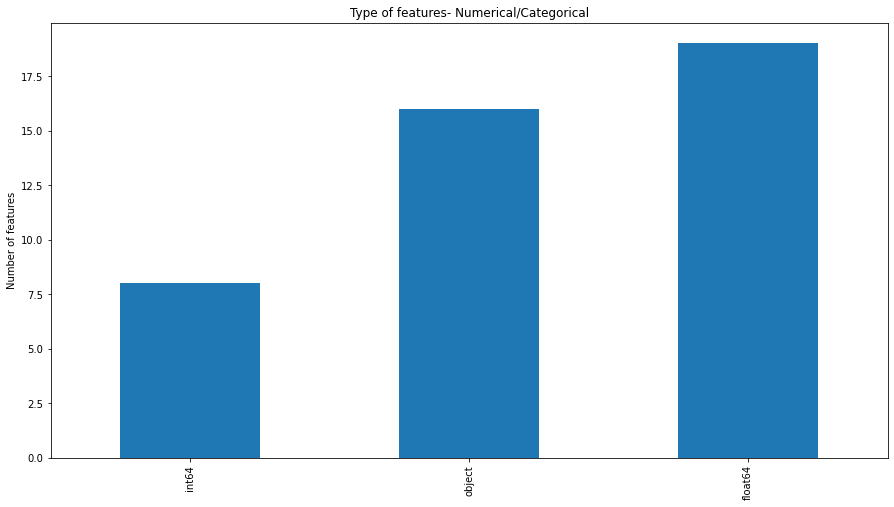

In [30]:
attr_type(datasets[ds_name])

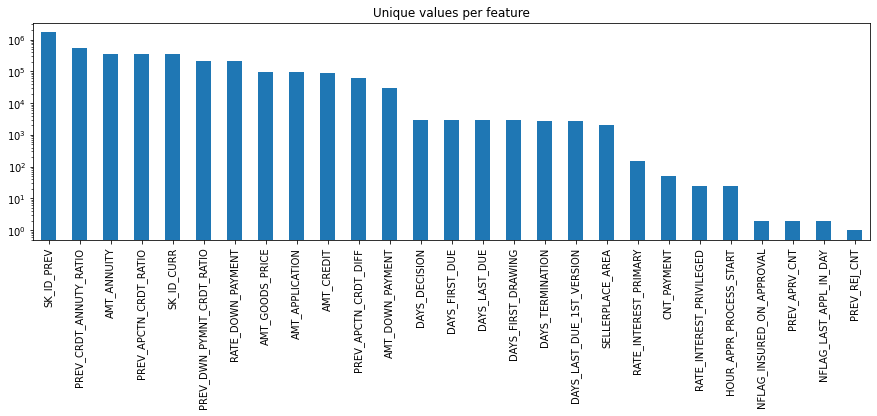

In [31]:
unique_values(datasets[ds_name]) 

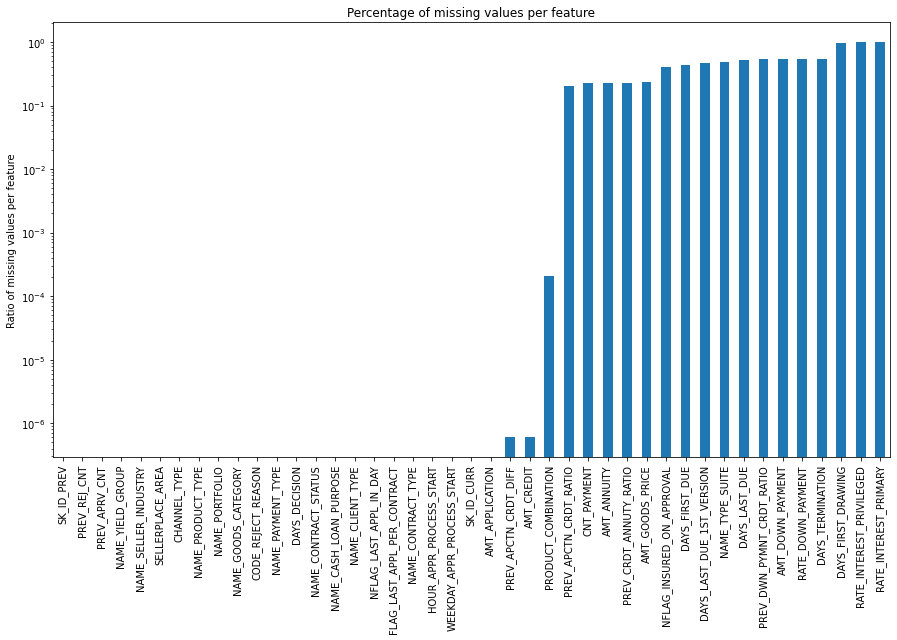

In [32]:
 percent_missing(datasets[ds_name])

In [33]:
#categorical_count(datasets[ds_name])

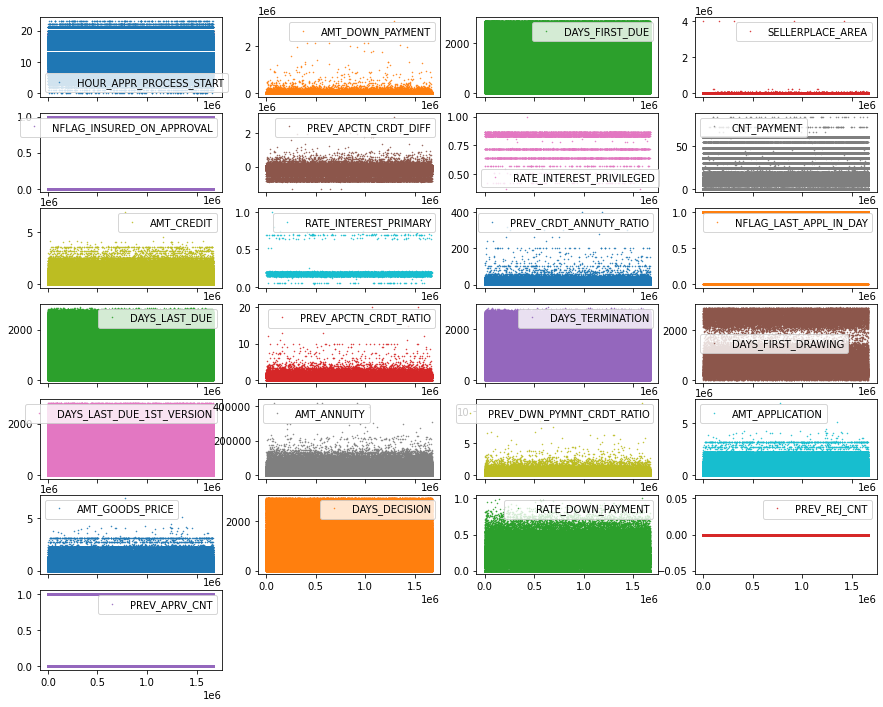

In [34]:
numerical_features(datasets[ds_name],only_num_cat)

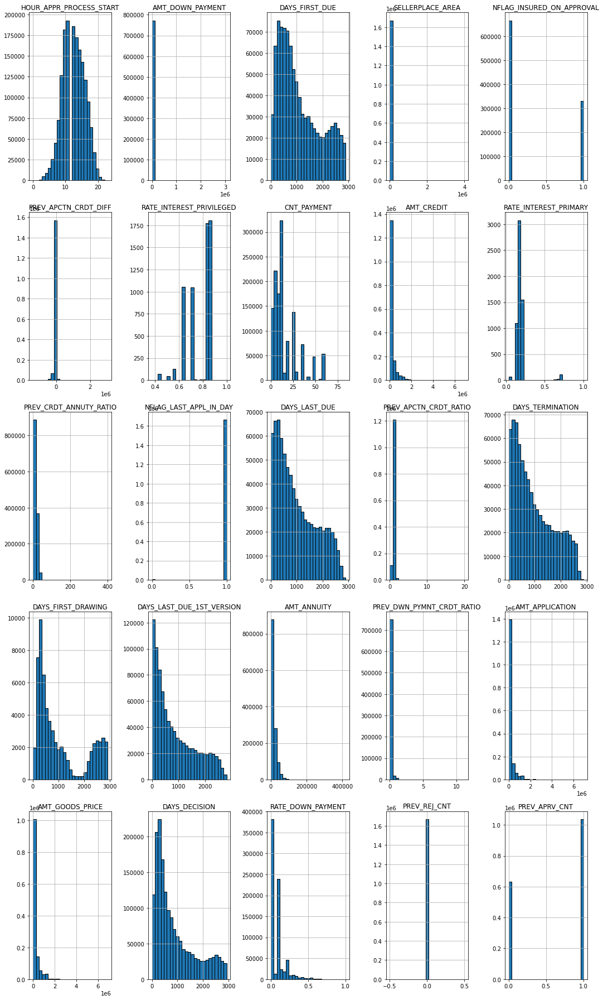

In [35]:
num_hist(datasets[ds_name][only_num_cat])

Text(0.5, 1.0, 'All features with missing data')

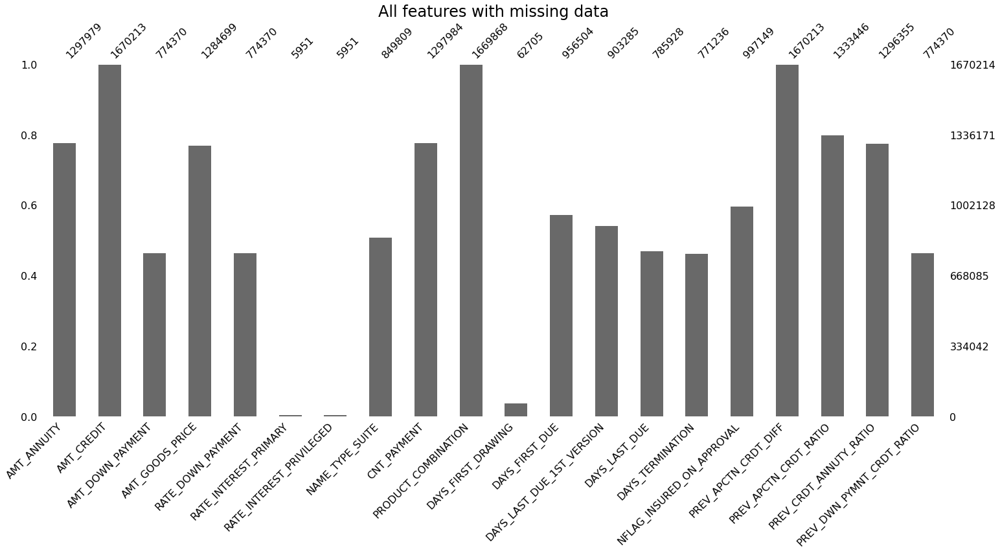

In [36]:
all_missing_values_plot(datasets[ds_name])

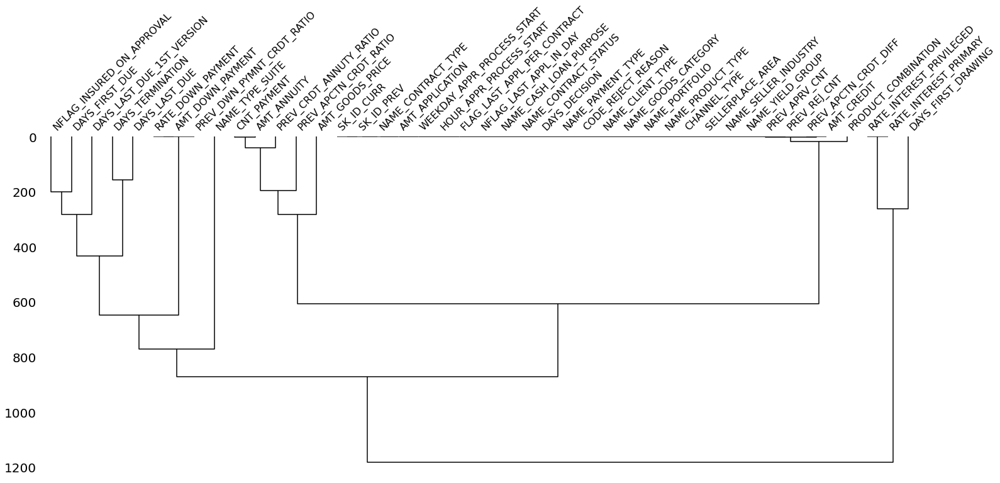

In [37]:
dendo(datasets[ds_name])

### EDAV FOR Credit Card Balance 

In [38]:
ds_name= 'credit_card_balance'
print("Table under consideration:",ds_name.upper())
print("------------------------------------------------------------------------")
id_cols, feat_num, feat_cat, features =  id_num_cat_feature(datasets[ds_name])
only_num_cat = list(set(feat_num)-set(['SK_ID_CURR','SK_ID_PREV','SK_ID_BUREAU']))

#VISUALIZATION FUNCTIONS NEED TO DO THIS INDIVIDUALLY FOR ALL TABLES
#attr_type(datasets[ds_name])
#unique_values(datasets[ds_name]) 
#percent_missing(datasets[ds_name])
#numerical_features(datasets[ds_name],only_num_cat)
#num_hist(datasets[ds_name][only_num_cat])
#all_missing_values_plot(datasets[ds_name])
#dendo(datasets[ds_name])

Table under consideration: CREDIT_CARD_BALANCE
------------------------------------------------------------------------
--------
# of ID's: 1
 ID's: ['SK_ID_CURR']
--------
# of numerical   features: 22
Numerical   features: ['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE', 'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT', 'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY', 'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT', 'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE', 'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT', 'CNT_INSTALMENT_MATURE_CUM', 'SK_DPD', 'SK_DPD_DEF']
--------
# of categorical features: 1
Categorical features: ['NAME_CONTRACT_STATUS']
--------
# All features: 22
All features: ['SK_ID_PREV', 'AMT_PAYMENT_TOTAL_CURRENT', 'AMT_RECEIVABLE_PRINCIPAL', 'AMT_PAYMENT_CURRENT', 'CNT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_P

-------------------------Type of Features-------------------------------


<AxesSubplot:title={'center':'Type of features- Numerical/Categorical'}, ylabel='Number of features'>

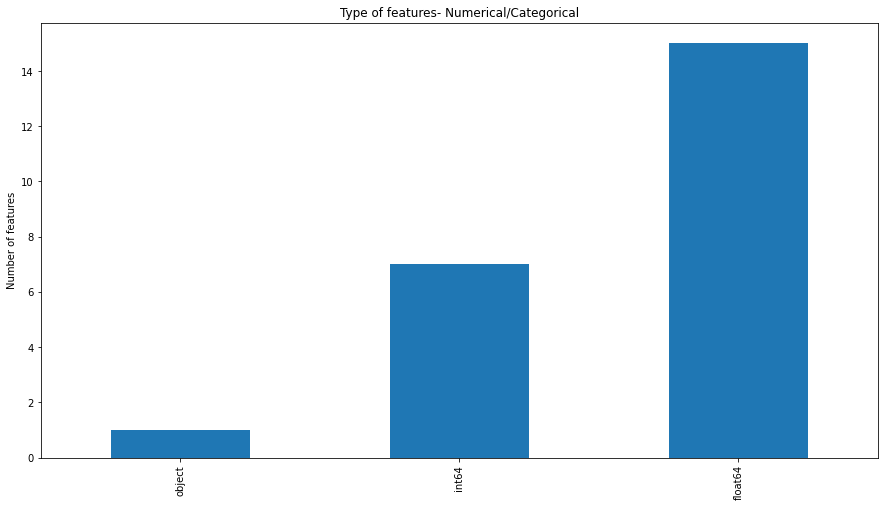

In [45]:
print("-------------------------Type of Features for Credit Card Balance-------------------------------")
attr_type(datasets[ds_name])

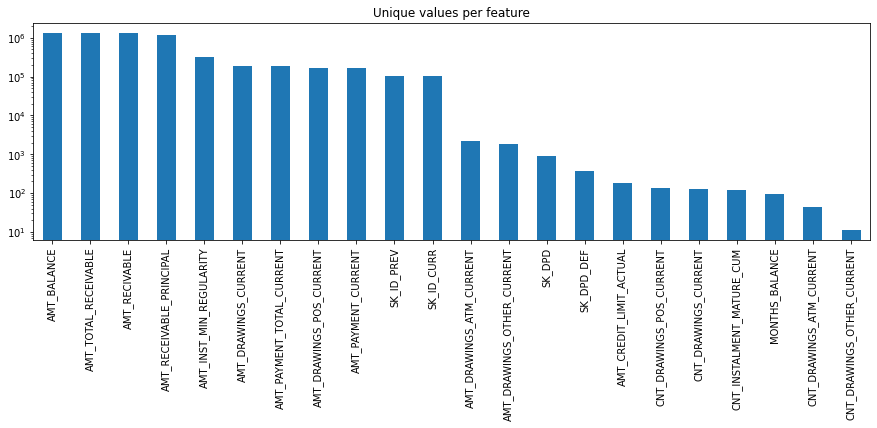

In [39]:
print("-------------------------UNIQUE VALUES for Credit Card Balance----------------------------------")
unique_values(datasets[ds_name])

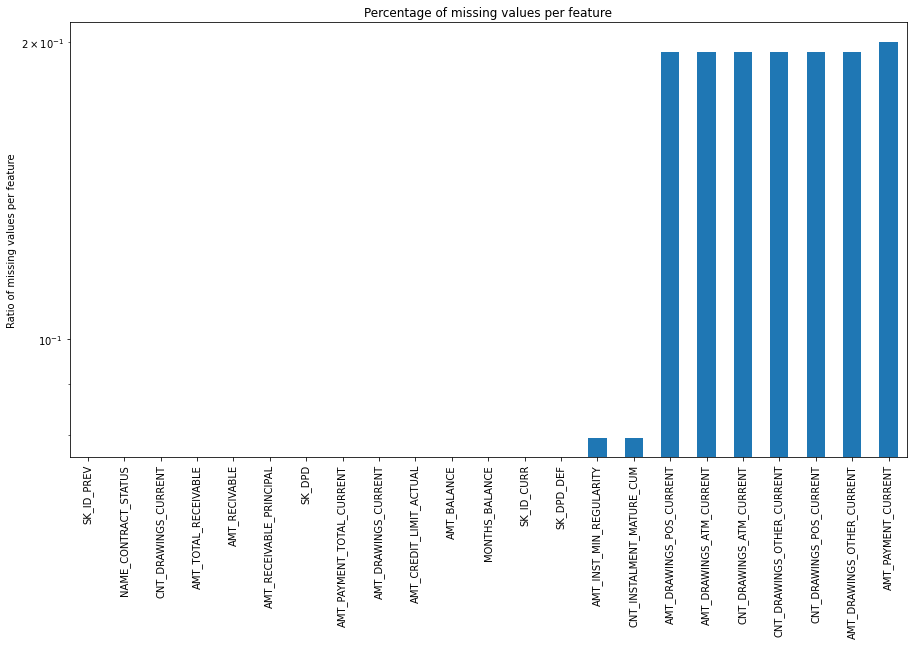

In [40]:
print("-------------------------MISSING PERCENTAGE for Credit Card Balance-----------------------------")
percent_missing(datasets[ds_name])

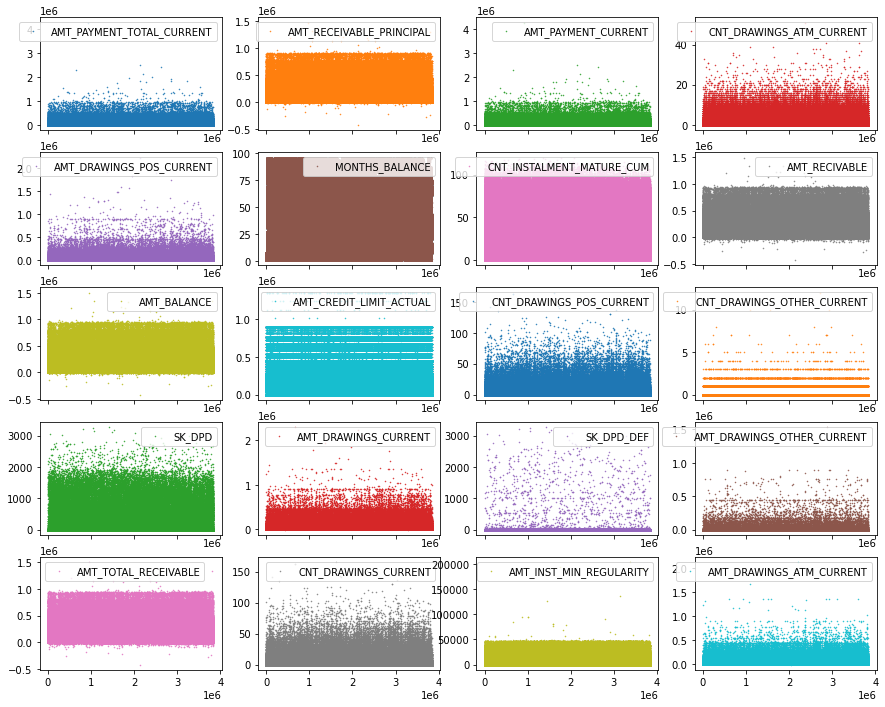

In [41]:
print("-------------------------NUM FEATURES-SCATTER for Credit Card Balance-------------------------------")
numerical_features(datasets[ds_name],only_num_cat)

-------------------------NUM FEATURES - HISTOGRAM ----------------------


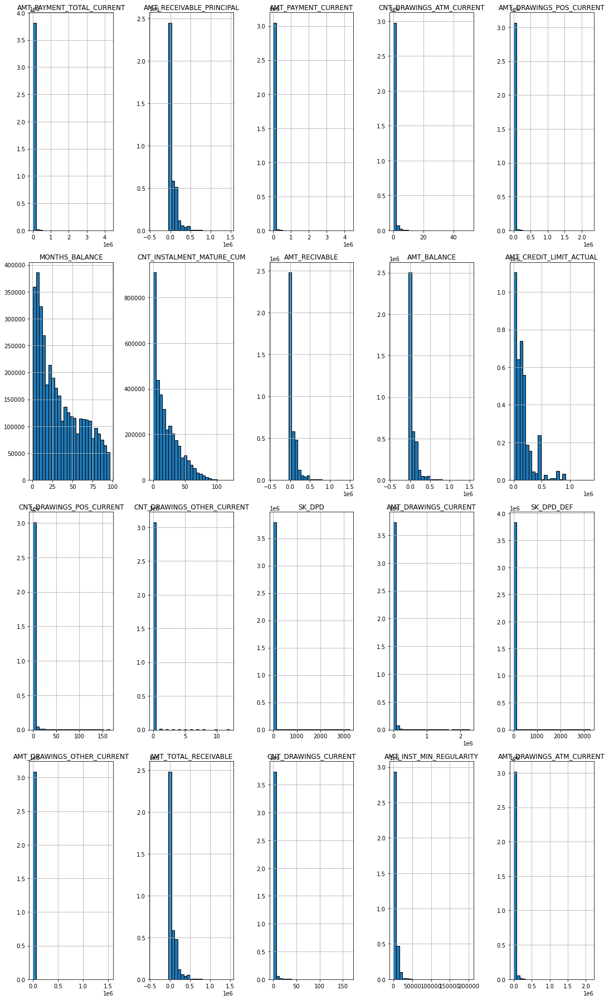

In [44]:
print("-------------------------Credit Card Balance - HISTOGRAM ----------------------")
num_hist(datasets[ds_name][only_num_cat])

Text(0.5, 1.0, 'All features with missing data')

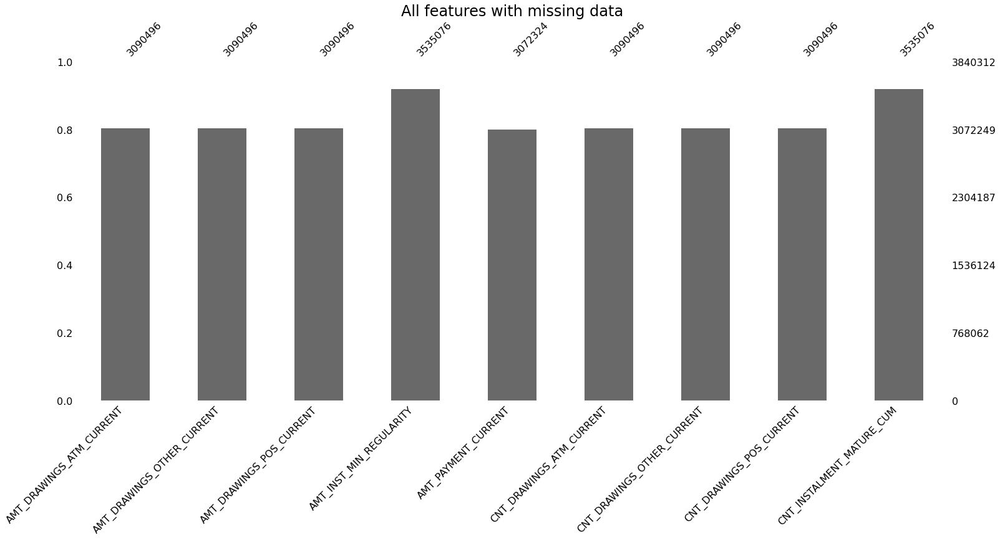

In [42]:
print("-------------------------All Missing Features for Credit Card Balance---------------------------")
all_missing_values_plot(datasets[ds_name])

-------------------------Dendogram for Credit Card Balance---------------------------


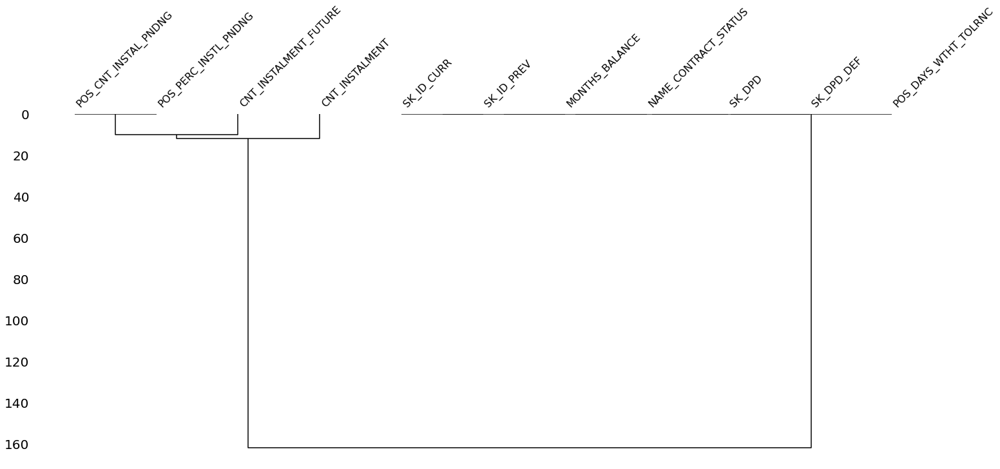

In [68]:
print("-------------------------Dendogram for Credit Card Balance---------------------------")
dendo(datasets[ds_name])

BELOW TWO CELLS CAN BE REMOVED AS WE HAVE TO INDIVUALLY DO THE EDAV FOR ALL TABLES

Table under consideration: PREVIOUS_APPLICATION
------------------------------------------------------------------------
--------
# of ID's: 1
 ID's: ['SK_ID_CURR']
--------
# of numerical   features: 27
Numerical   features: ['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL', 'PREV_APRV_CNT', 'PREV_REJ_CNT', 'PREV_APCTN_CRDT_DIFF', 'PREV_APCTN_CRDT_RATIO', 'PREV_CRDT_ANNUTY_RATIO', 'PREV_DWN_PYMNT_CRDT_RATIO']
--------
# of categorical features: 16
Categorical features: ['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMEN

KeyboardInterrupt: 

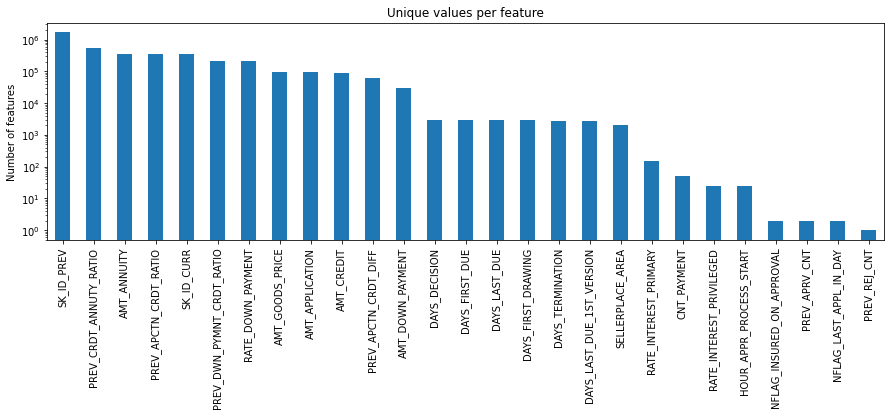

In [54]:
for i,ds_name in enumerate(datasets.keys()):
    
    #n = True
    #if n:
        
    if ds_name.upper() == 'PREVIOUS_APPLICATION':
        print("Table under consideration:",ds_name.upper())
        print("------------------------------------------------------------------------")
        id_cols, feat_num, feat_cat, features =  id_num_cat_feature(datasets[ds_name])
        only_num_cat = list(set(feat_num)-set(['SK_ID_CURR','SK_ID_PREV','SK_ID_BUREAU']))

        
        print("------------------------------------------------------------------------")
        print("-------------------------Type of Features-------------------------------")
        attr_type(datasets[ds_name])
        print("------------------------------------------------------------------------")
        print("-------------------------UNIQUE VALUES----------------------------------")
        unique_values(datasets[ds_name]) 
        print("------------------------------------------------------------------------")
        print("-------------------------MISSING PERCENTAGE-----------------------------")
        percent_missing(datasets[ds_name])
        print("------------------------------------------------------------------------")
        print("-------------------------CATEGORICAL COUNT------------------------------")
        #categorical_count(datasets[ds_name],feat_cat)
        print("------------------------------------------------------------------------")
        print("-------------------------NUM FEATURES-DOT-------------------------------")
        numerical_features(datasets[ds_name],only_num_cat)
        print("------------------------------------------------------------------------")
        print("-------------------------NUM FEATURES - HISTOGRAM ----------------------")
        num_hist(datasets[ds_name][only_num_cat])
        print("------------------------------------------------------------------------")
        print("-------------------------Continous Features ----------------------------")
        #continous_features(df_x,only_num_cat)
        print("------------------------------------------------------------------------")
        print("-------------------------All Missing Features---------------------------")
        all_missing_values_plot(datasets[ds_name])


#dendogram; groups together columns that have strong correlations in nullity.
#If a number of columns are grouped together at level zero, then the presence 
#of nulls in one of those columns is directly related to the presence or absence
#of nulls in the others columns. The more separated the columns in the tree, 
#the less likely the null values can be correlated between the columns.
dendo(datasets[ds_name])


## Coorelation EDAV

### Correlation Heatmap of applcation train

In [69]:
numerical_ix =
plt.figure(figsize=(12,8))
sns.heatmap(datasets["application_train"][numerical_ix].corr(), cmap="viridis")

NameError: name 'numerical_ix' is not defined

<Figure size 864x576 with 0 Axes>

## Correlation Plots Maps

A correlation matrix is a table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables. This correlation is a value put on the relationship between two attributes. A correlation matrix is used to summarize data, then with that information do more advanced analysis.

In [70]:
def corr_plot(data, remove=["Id"], corr_coef = "pearson", figsize=(20, 20)):
    if len(remove) > 0:
        num_cols2 = [x for x in data.columns if (x not in remove)]

    sns.set(font_scale=1.1)
    c = data[num_cols2].corr(method = corr_coef)
    mask = np.triu(c.corr(method = corr_coef))
    plt.figure(figsize=figsize)
    sns.heatmap(c,
                annot=True,
                fmt='.1f',
                cmap='coolwarm',
                square=True,
                mask=mask,
                linewidths=1,
                cbar=False)
    plt.show()

------------------------------------------------------------------------
Table under consideration FOR CORRELATION PLOT: APPLICATION_TRAIN


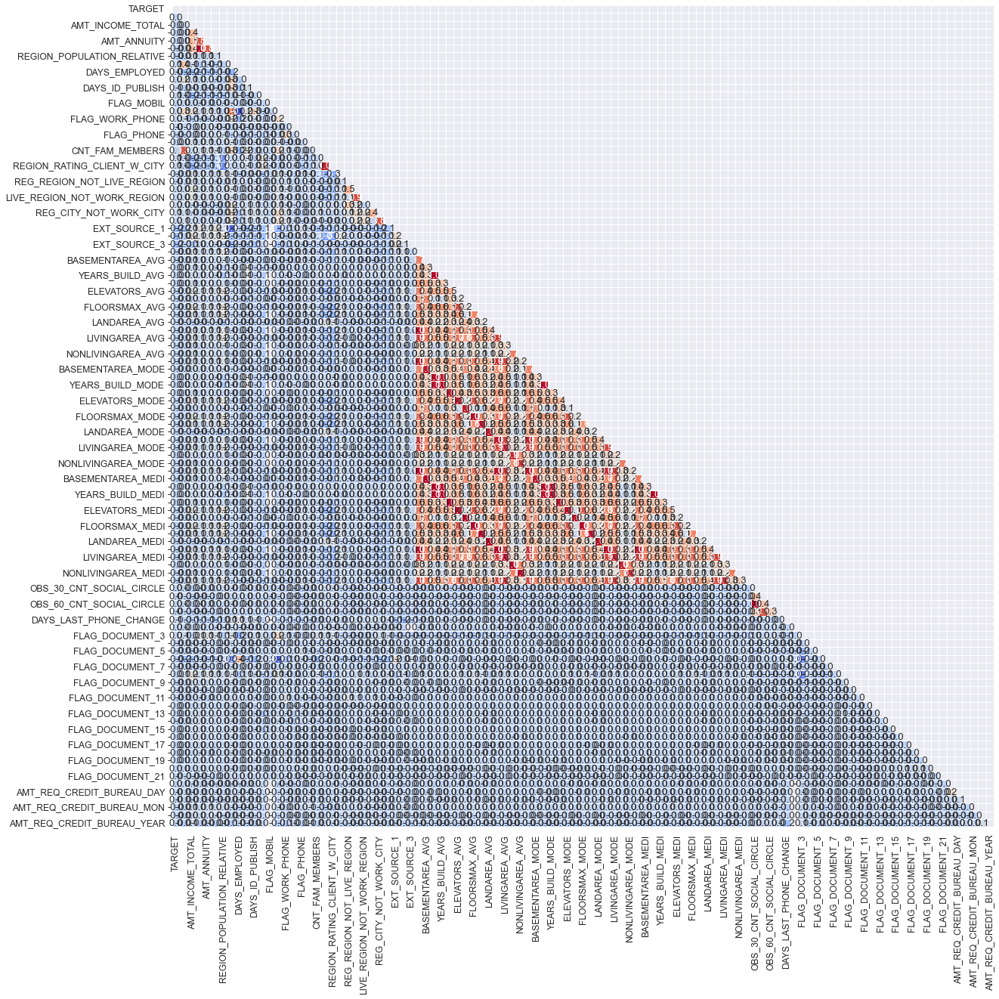

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR CORRELATION PLOT: APPLICATION_TEST


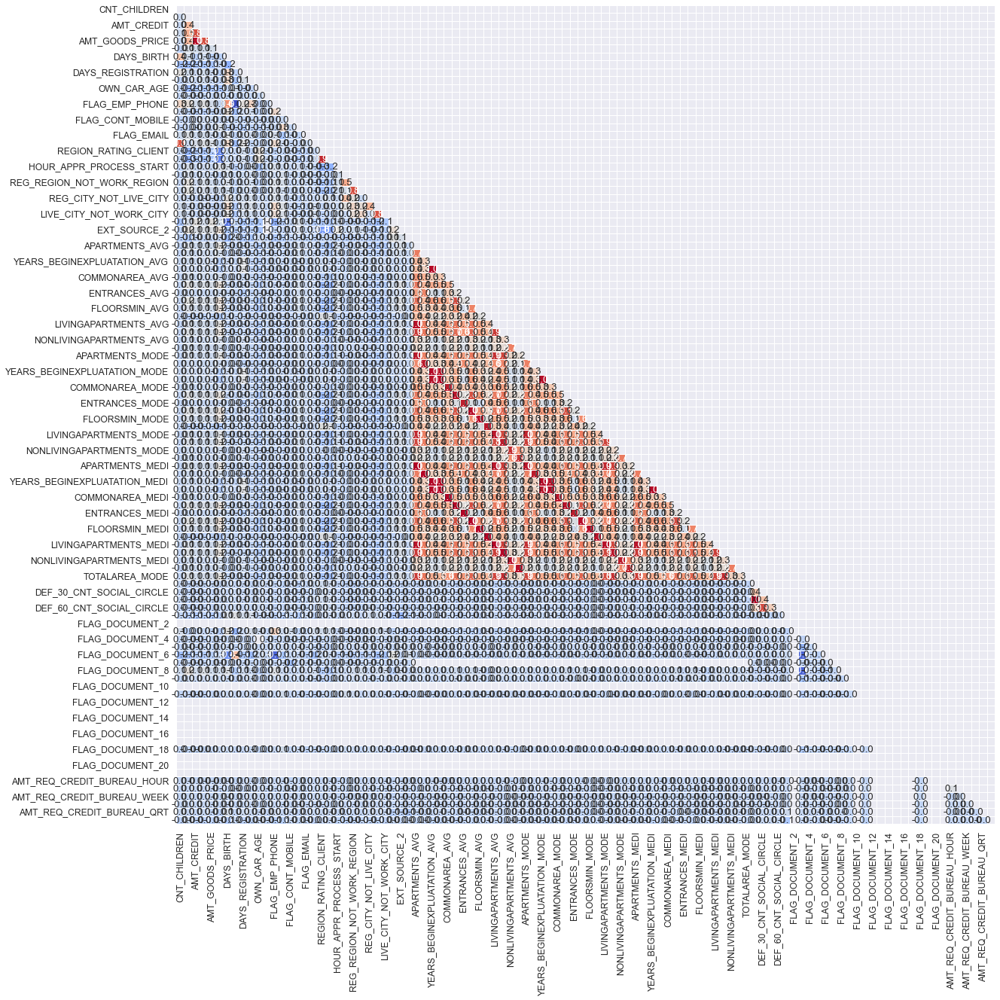

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR CORRELATION PLOT: BUREAU


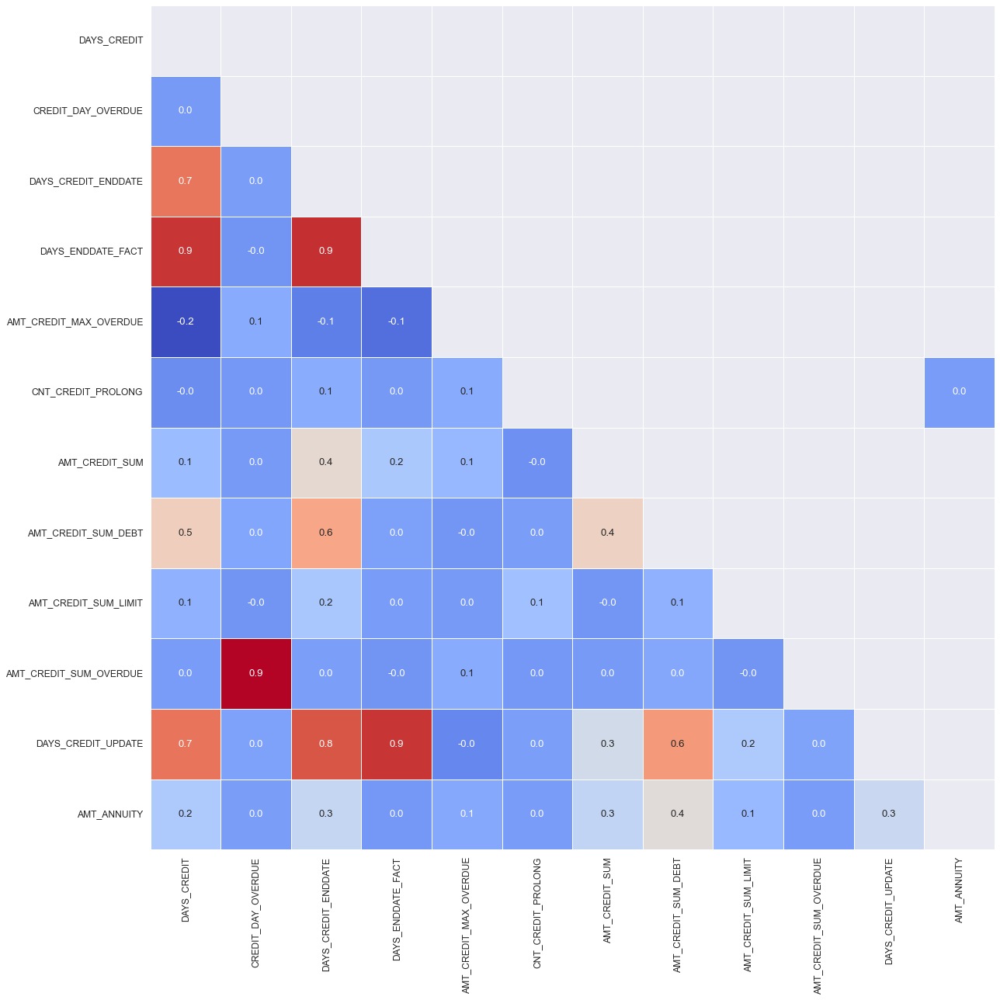

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR CORRELATION PLOT: CREDIT_CARD_BALANCE


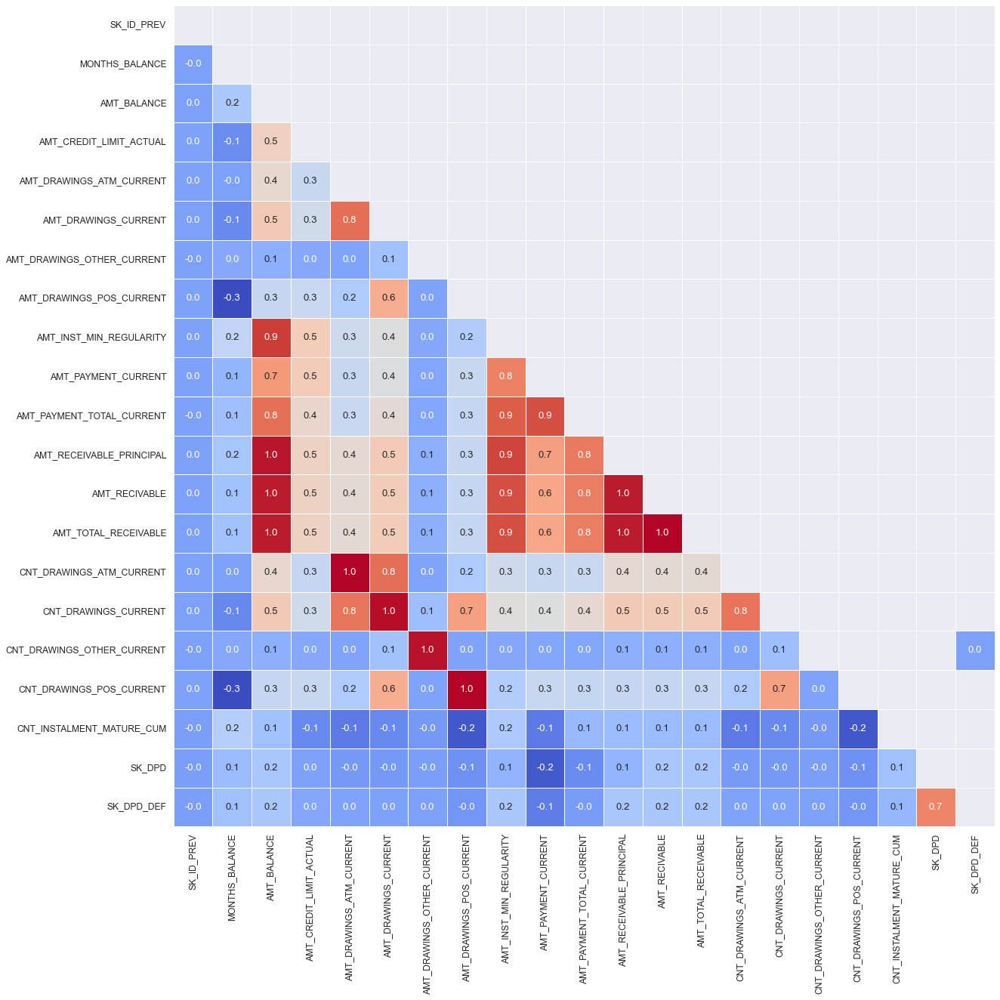

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR CORRELATION PLOT: INSTALLMENTS_PAYMENTS


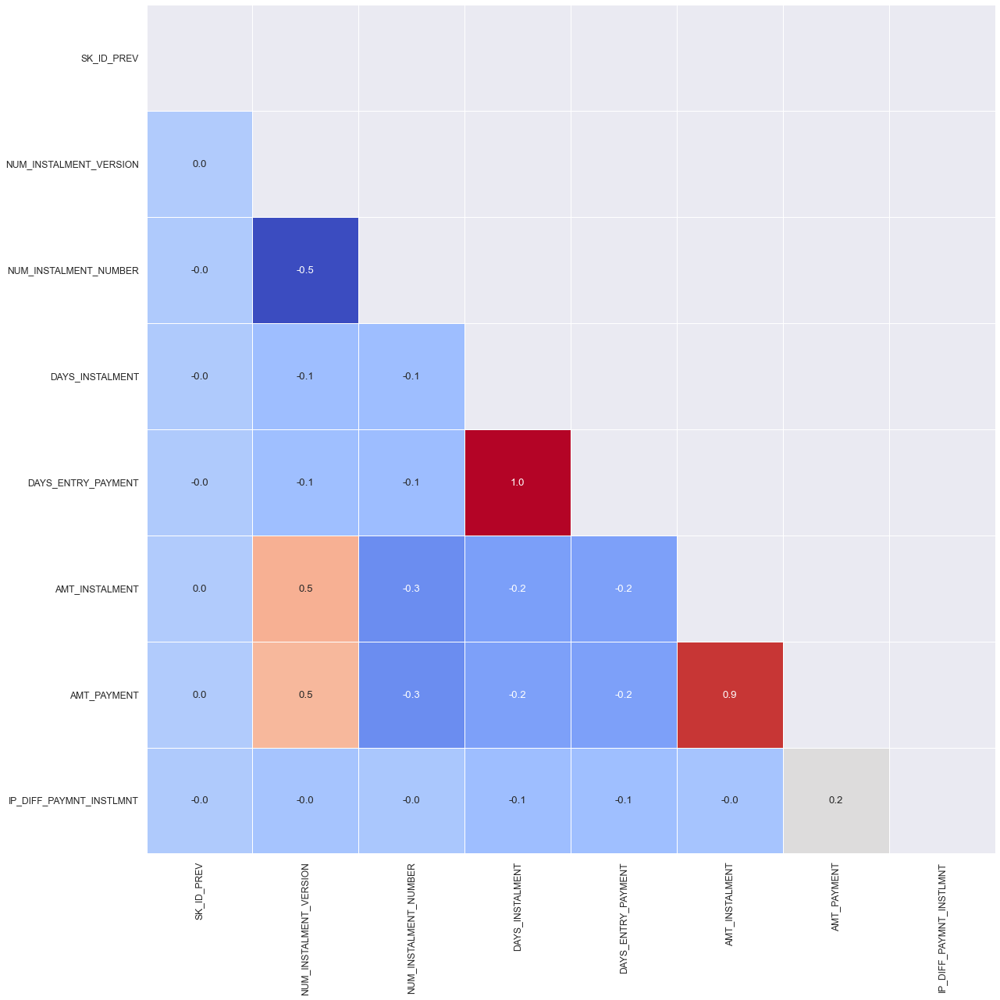

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR CORRELATION PLOT: PREVIOUS_APPLICATION


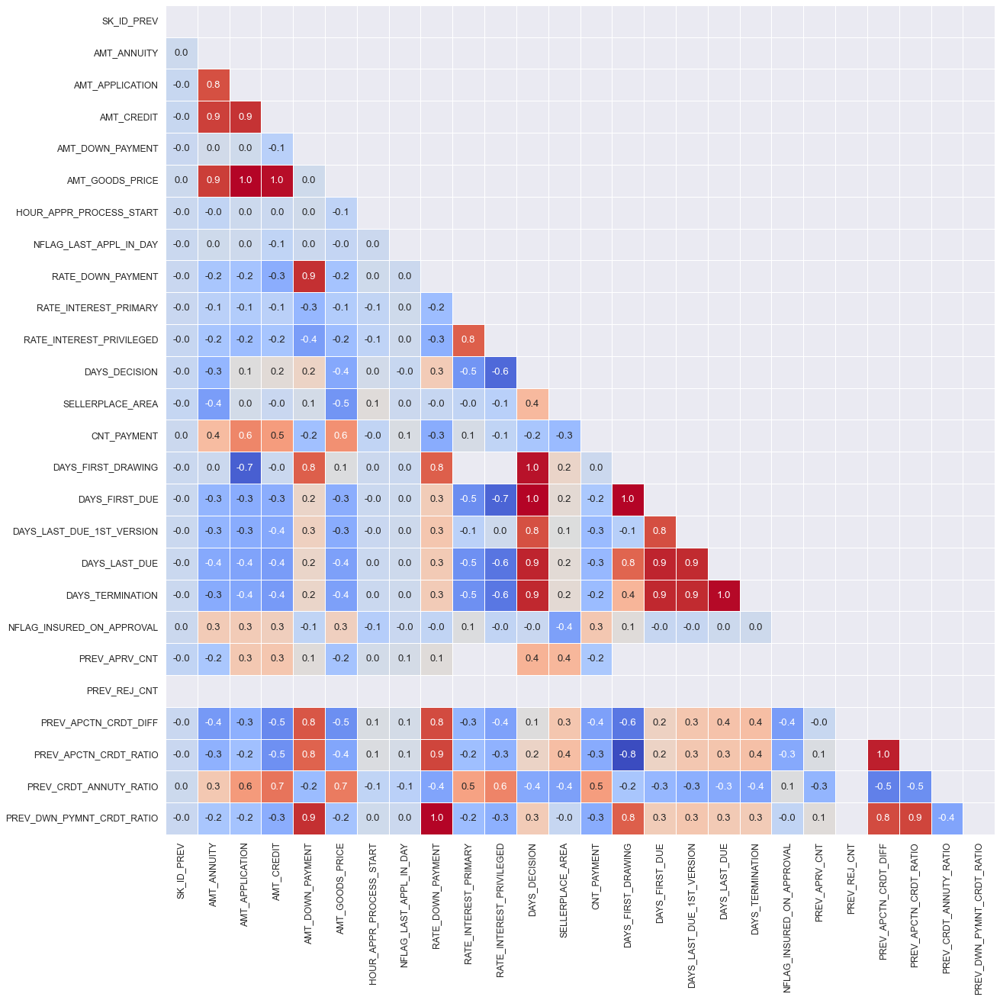

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR CORRELATION PLOT: POS_CASH_BALANCE


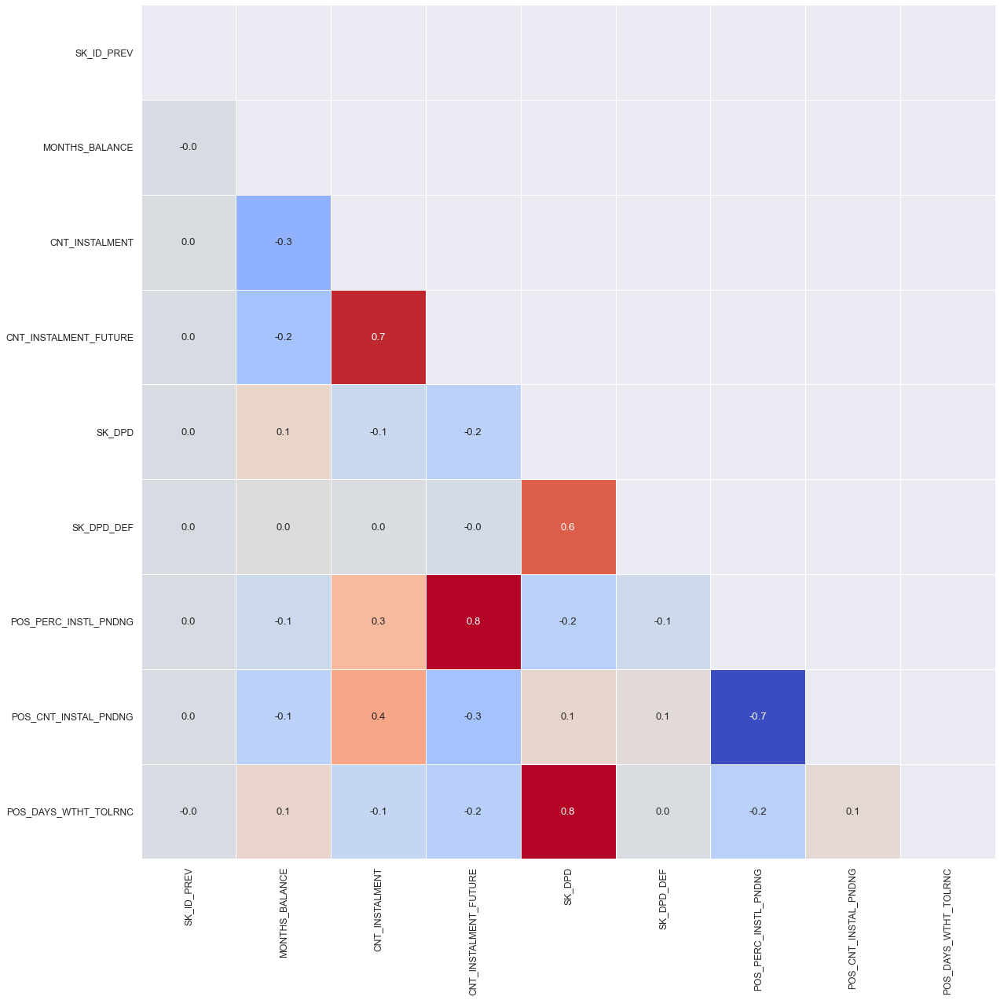

------------------------------------------------------------------------
------------------------------------------------------------------------


In [72]:
for i,ds_name in enumerate(datasets.keys()):
    if(ds_name != "bureau_balance"):
        print("------------------------------------------------------------------------")
        print("Table under consideration FOR CORRELATION PLOT:",ds_name.upper())
        corr_plot(datasets[ds_name], remove=['SK_ID_CURR','SK_ID_BUREAU'], corr_coef = "spearman")
        print("------------------------------------------------------------------------")
        print("------------------------------------------------------------------------")


## Numerical Plots and Visualizations

These visualizations consist of the paired plots for each column in the each table. 

The first is a histogram, a diagram consisting of rectangles whose area is proportional to the frequency of a variable and whose width is equal to the class interval, which helps to visualize distribution. 

The second is a boxplot, which is a standardized way of displaying the distribution of data based on a five number summary (“minimum”, first quartile Q1, median, third quartile Q3 and “maximum”). It can tell you about your outliers and what their values are.

https://builtin.com/data-science/boxplot#:~:text=What%20Is%20a%20Boxplot%3F,and%20what%20their%20values%20are.

The third is a Kernel Density Plot which also helps to visualize distriubtion over a time peroid or some continuous value.  

In [75]:
def grab_col_names(dataframe, cat_th=10, car_th=20, show_date=False):
    date_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "datetime64[ns]"]
    cat_cols = dataframe.select_dtypes(["object", "category"]).columns.tolist()
    
    num_but_cat = [col for col in dataframe.select_dtypes(["float", "integer"]).columns if dataframe[col].nunique() < cat_th]
    cat_but_car = [col for col in dataframe.select_dtypes(["object", "category"]).columns if dataframe[col].nunique() > car_th]
    
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    num_cols = dataframe.select_dtypes(["float", "integer"]).columns
    num_cols = [col for col in num_cols if col not in num_but_cat]
    
    if show_date == True:
        return date_cols, cat_cols, cat_but_car, num_cols, num_but_cat
    else:
        return cat_cols, cat_but_car, num_cols, num_but_cat

In [76]:
def num_plot(data, num_cols, remove=["Id"], hist_bins=10, figsize=(20, 4)):

    if len(remove) > 0:
        num_cols2 = [x for x in num_cols if (x not in remove)]

    for i in num_cols2:
        fig, axes = plt.subplots(1, 3, figsize=figsize)
        data.hist(str(i), bins=hist_bins, ax=axes[0])
        data.boxplot(str(i), ax=axes[1], vert=False);
        try:
            sns.kdeplot(np.array(data[str(i)]))
        except:
            ValueError

        axes[1].set_yticklabels([])
        axes[1].set_yticks([])
        axes[0].set_title(i + " | Histogram")
        axes[1].set_title(i + " | Boxplot")
        axes[2].set_title(i + " | Density")
        plt.show()

------------------------------------------------------------------------
Table under consideration FOR NUMERICAL PLOTS: APPLICATION_TRAIN


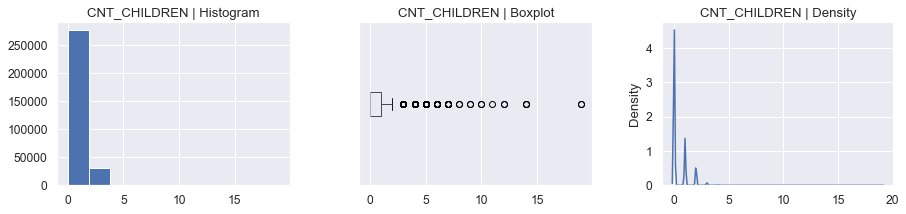

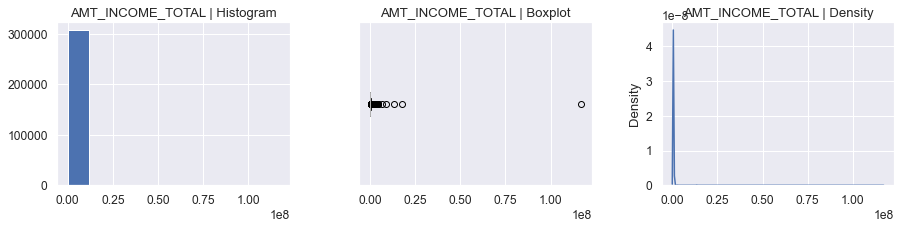

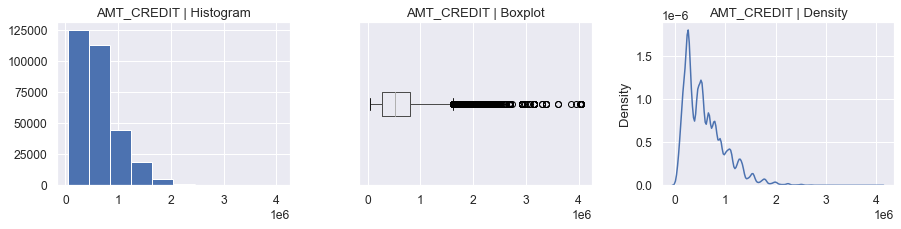

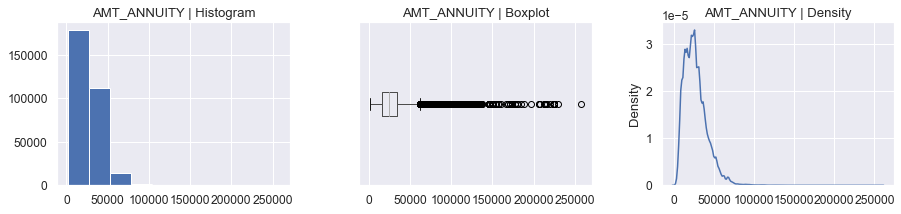

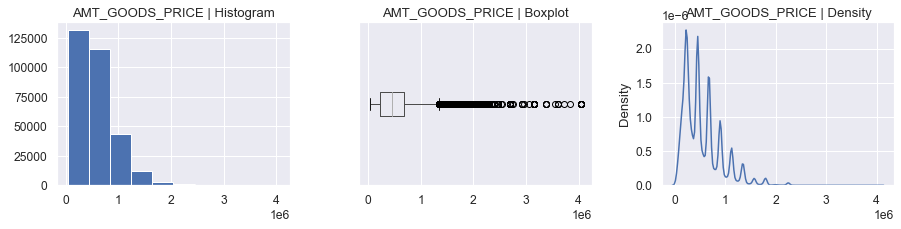

...

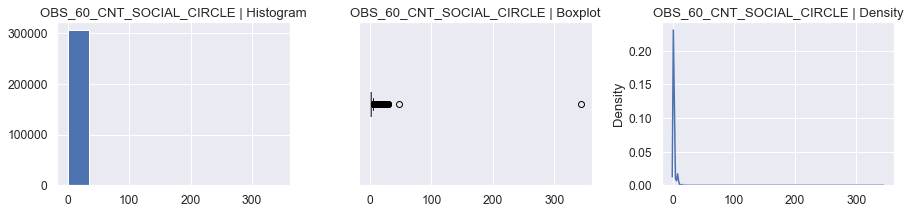

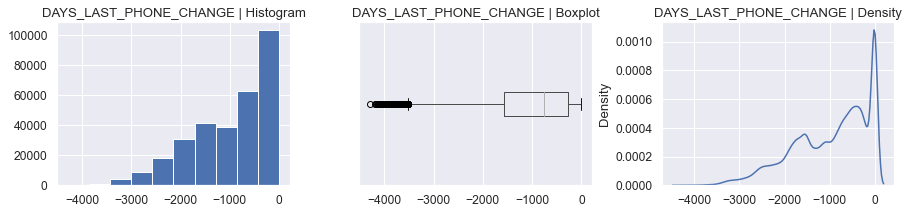

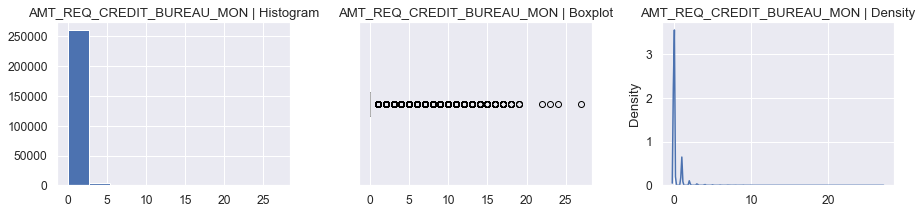

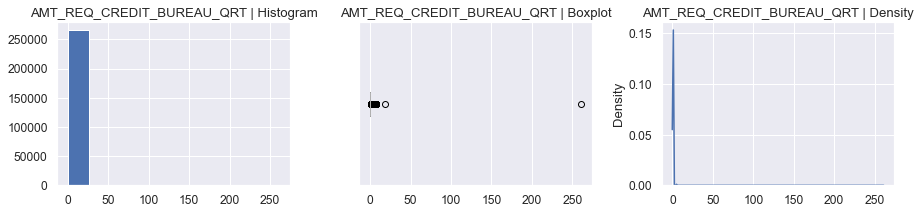

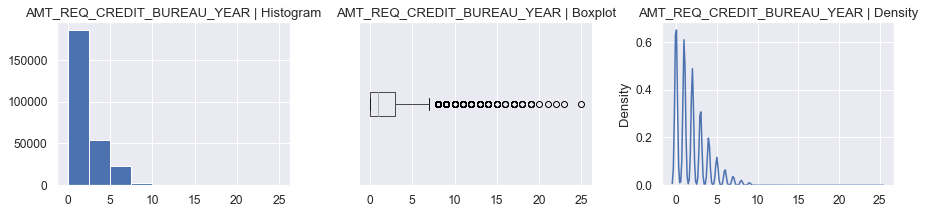

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR NUMERICAL PLOTS: APPLICATION_TEST


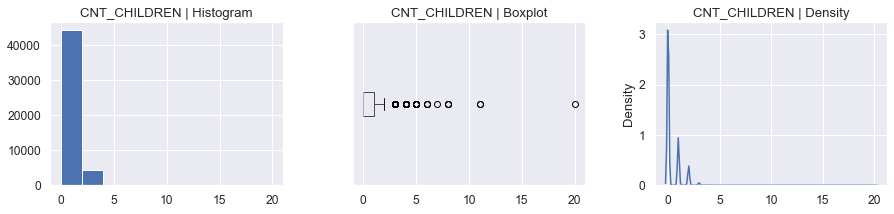

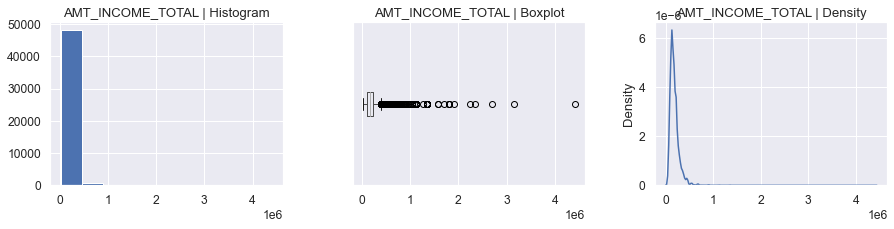

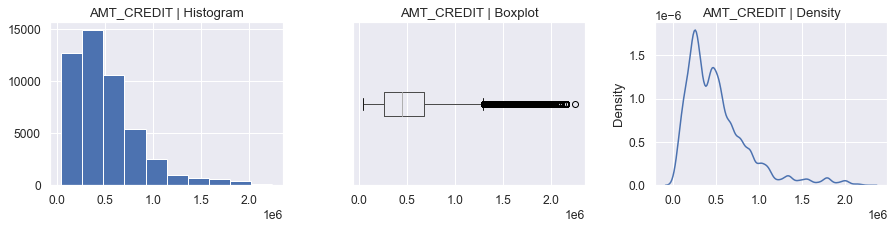

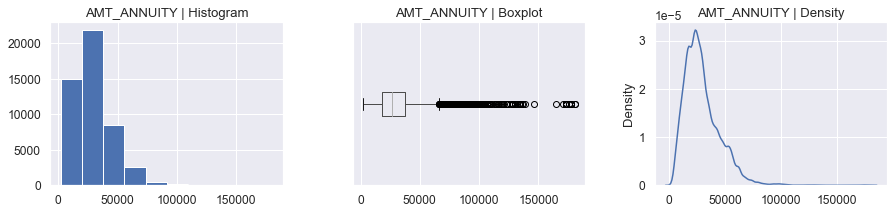

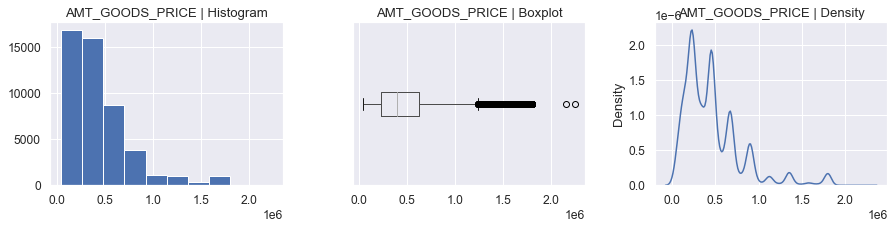

...

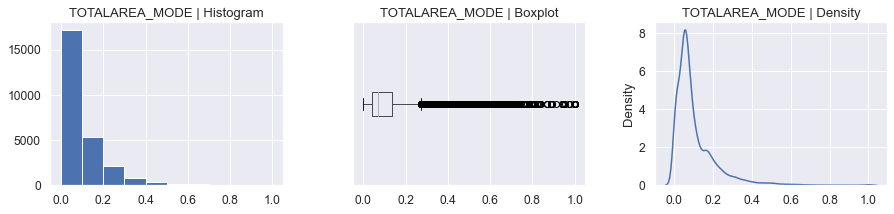

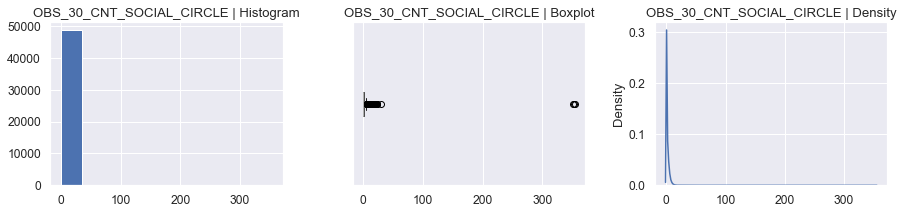

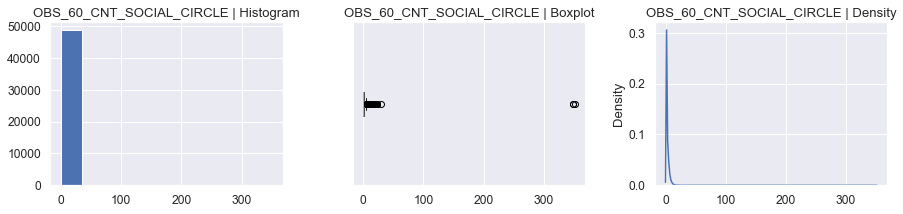

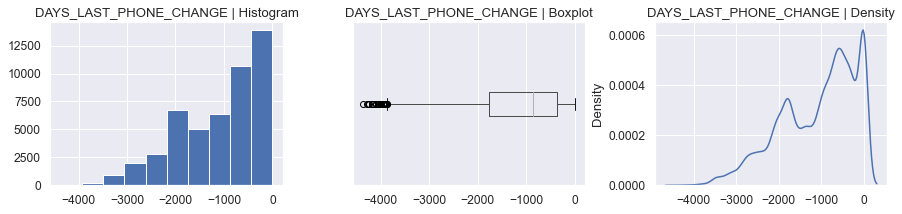

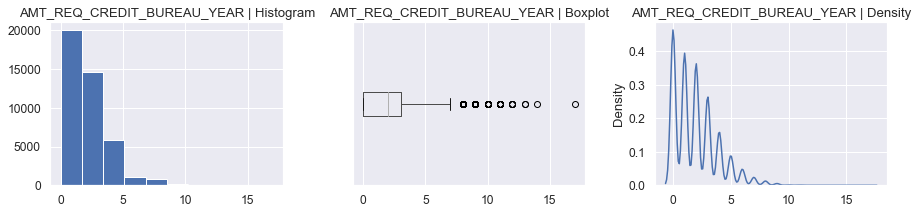

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR NUMERICAL PLOTS: BUREAU


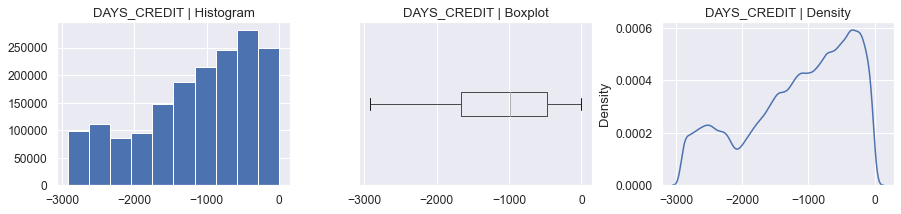

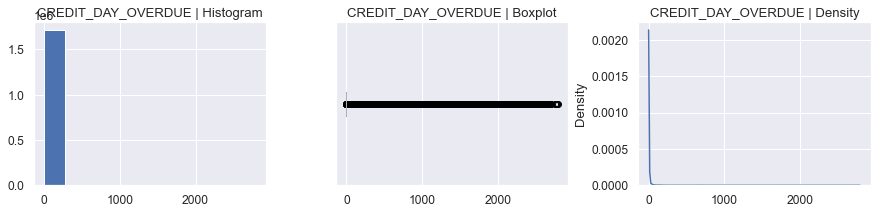

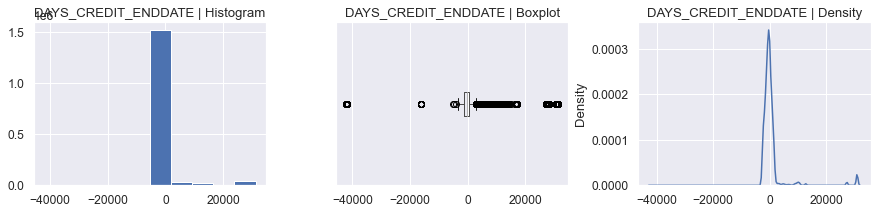

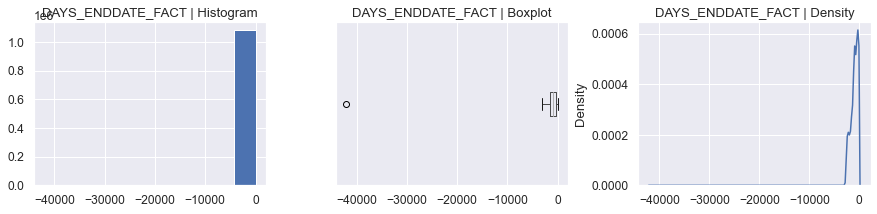

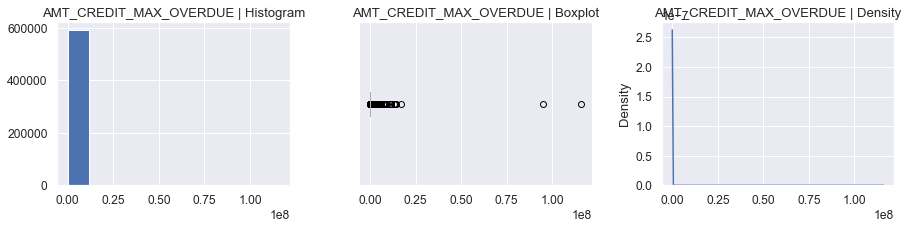

...

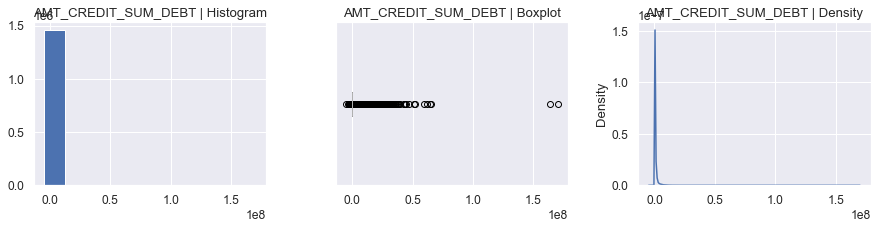

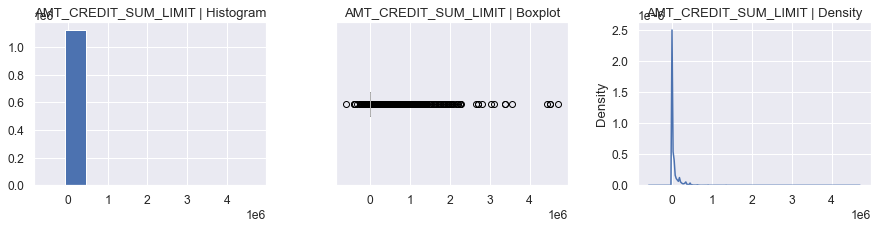

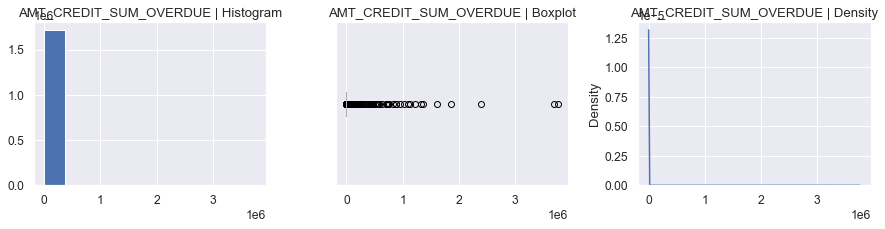

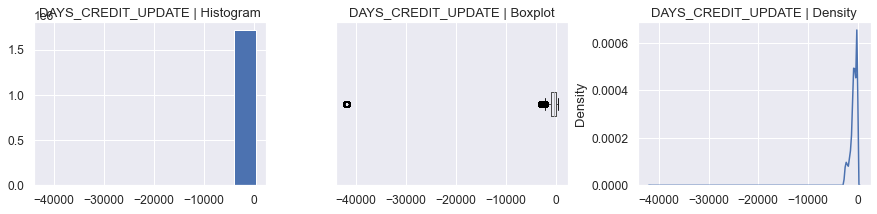

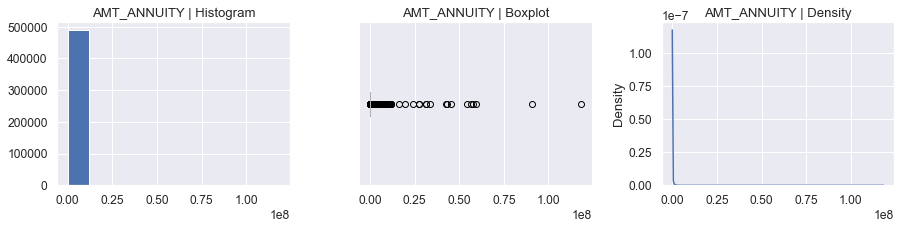

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR NUMERICAL PLOTS: BUREAU_BALANCE


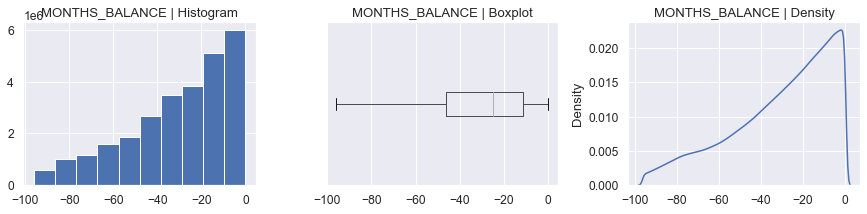

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR NUMERICAL PLOTS: CREDIT_CARD_BALANCE


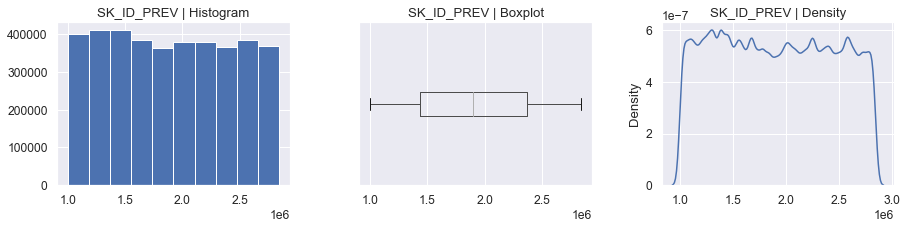

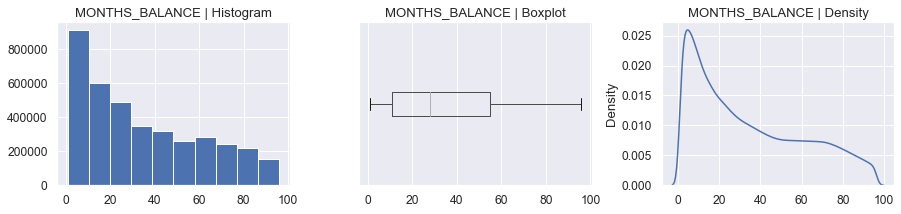

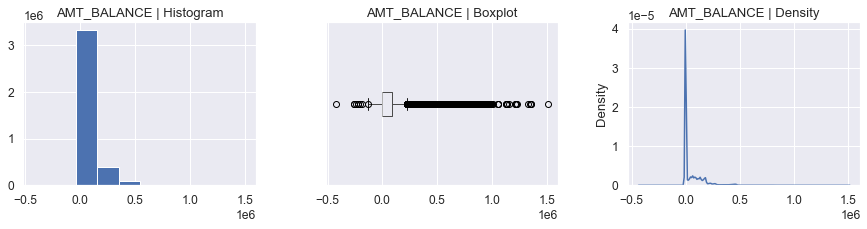

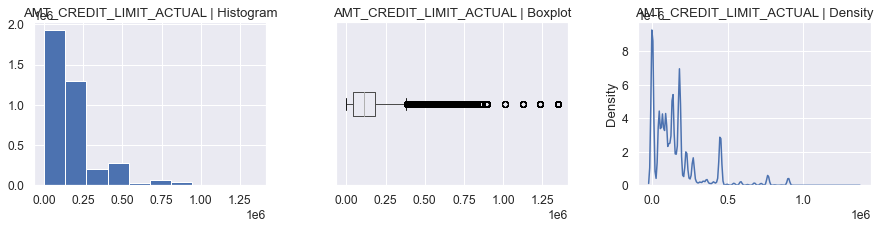

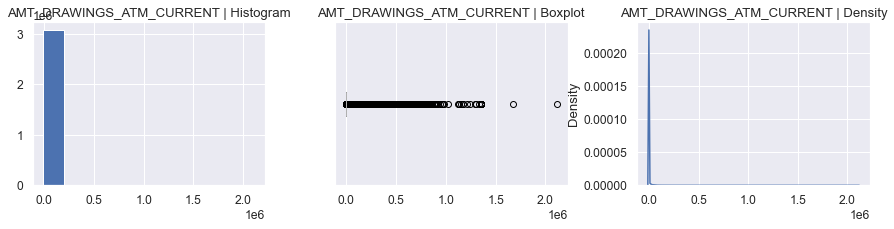

...

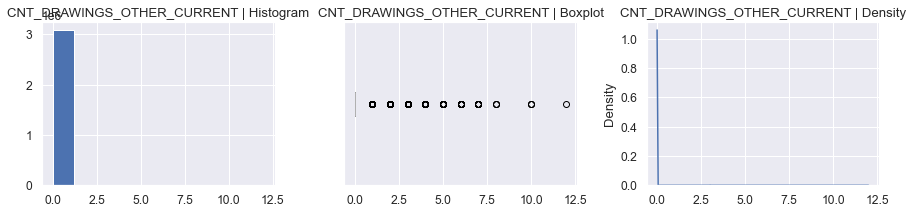

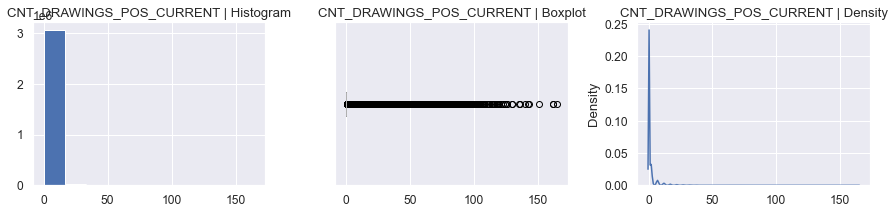

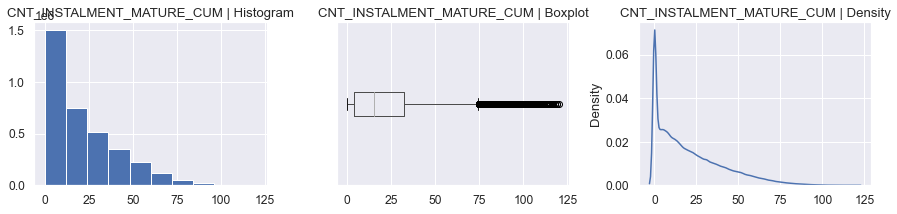

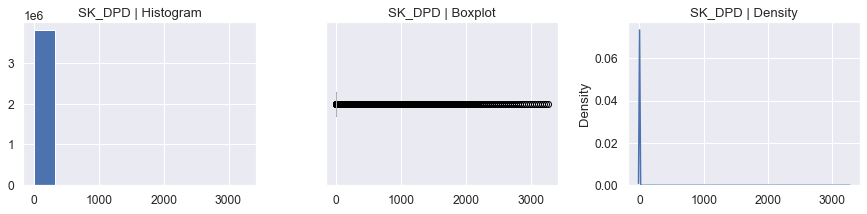

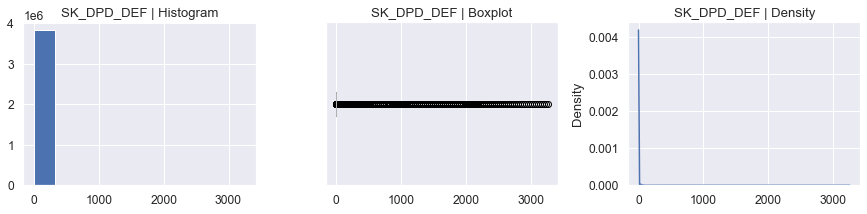

------------------------------------------------------------------------
------------------------------------------------------------------------
------------------------------------------------------------------------
Table under consideration FOR NUMERICAL PLOTS: INSTALLMENTS_PAYMENTS


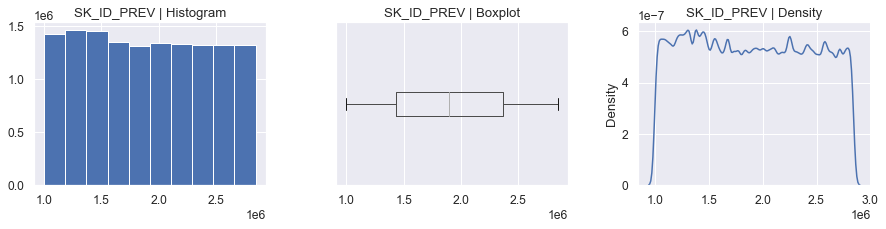

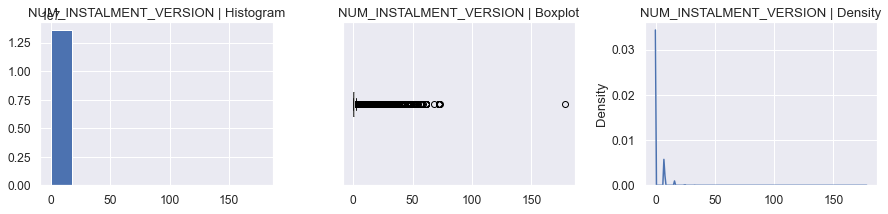

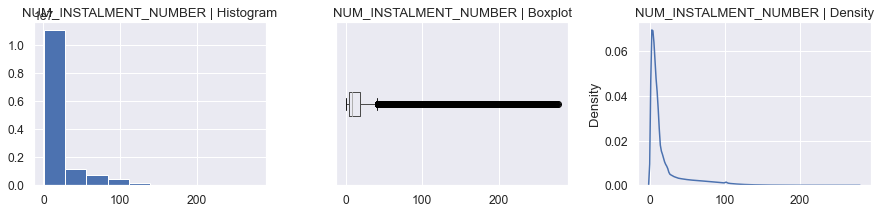

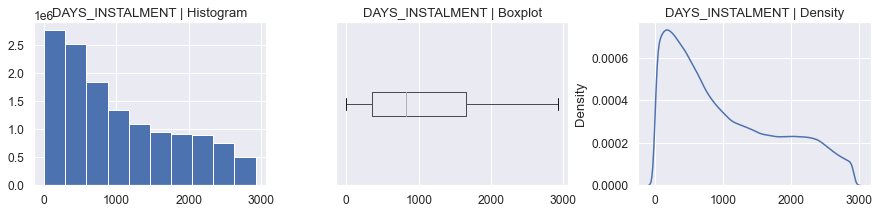

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f84e94c1ca0> (for post_execute):


KeyboardInterrupt: 

In [59]:
for i,ds_name in enumerate(datasets.keys()):
    print("------------------------------------------------------------------------")
    _,_, num_cols, _ = grab_col_names(datasets[ds_name], car_th=10)
    datasets[ds_name].replace([np.inf, -np.inf], 0, inplace=True)
    print("Table under consideration FOR NUMERICAL PLOTS:",ds_name.upper())
    num_plot(datasets[ds_name], num_cols, remove=['SK_ID_CURR','SK_ID_BUREAU'], figsize = (15,3))
    print("------------------------------------------------------------------------")
    print("------------------------------------------------------------------------")


## Check Skewness/Distribution : Numerical data

**Look for skewed column in numerical data but ignore dates, Days,Flags, status, ID's.**

**Skewness in : AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY**

In [16]:
datasets["application_train"][numerical_ix]

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775,365243,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


**AMT_CREDIT and AMT_ANNUITY looks skewed. we wil do log transformation on these attributes and make them more mormalized.**

### AMT_CREDIT

Text(0.5, 1.0, 'Distribution - AMT_CREDIT ')

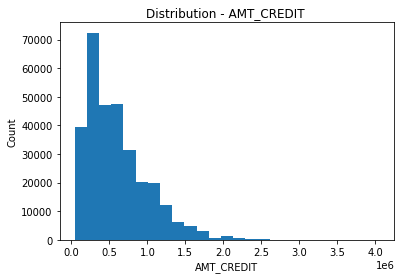

In [17]:
plt.hist(datasets["application_train"]['AMT_CREDIT'], bins=25);
plt.xlabel('AMT_CREDIT')
plt.ylabel('Count')
plt.title("Distribution - AMT_CREDIT ")

Text(0.5, 1.0, 'Distribution - Log(AMT_CREDIT) ')

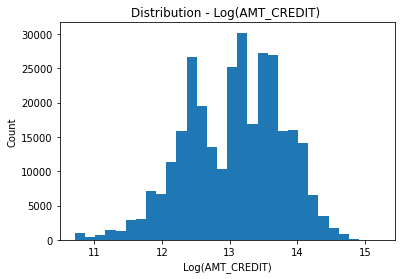

In [18]:
plt.hist(np.log(datasets["application_train"]['AMT_CREDIT']), bins=30);
plt.xlabel('Log(AMT_CREDIT)')
plt.ylabel('Count')
plt.title("Distribution - Log(AMT_CREDIT) ")

### AMT_ANNUITY

Text(0.5, 1.0, 'Distribution - AMT_ANNUITY ')

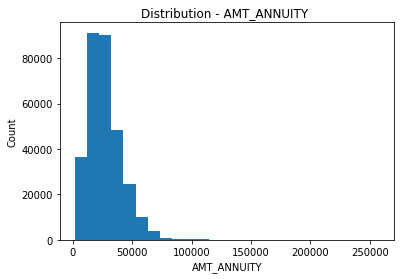

In [19]:
plt.hist(datasets["application_train"]['AMT_ANNUITY'], bins=25);
plt.xlabel('AMT_ANNUITY')
plt.ylabel('Count')
plt.title("Distribution - AMT_ANNUITY ")

Text(0.5, 1.0, 'Distribution - Log(AMT_ANNUITY) ')

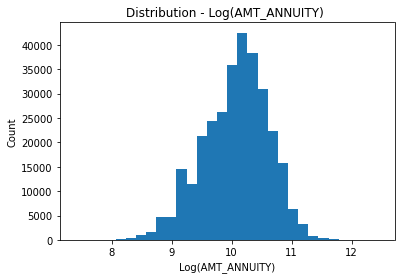

In [20]:
plt.hist(np.log(datasets["application_train"]['AMT_ANNUITY']), bins=30);
plt.xlabel('Log(AMT_ANNUITY)')
plt.ylabel('Count')
plt.title("Distribution - Log(AMT_ANNUITY) ")

## Missing data for application train

In [21]:
percent = (datasets["application_train"].isnull().sum()/datasets["application_train"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_train"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
missing_application_train_data.head(20)


,Percent,Train Missing Count
COMMONAREA_MEDI,69.87,214865
COMMONAREA_AVG,69.87,214865
COMMONAREA_MODE,69.87,214865
NONLIVINGAPARTMENTS_MODE,69.43,213514
NONLIVINGAPARTMENTS_AVG,69.43,213514
NONLIVINGAPARTMENTS_MEDI,69.43,213514
FONDKAPREMONT_MODE,68.39,210295
LIVINGAPARTMENTS_MODE,68.35,210199
LIVINGAPARTMENTS_AVG,68.35,210199
LIVINGAPARTMENTS_MEDI,68.35,210199


### Determine more than 50% null

Determine attributes which have more than 50% NULLS. Once done, these will be used as part of feature engineering.

In [22]:
nulls_50 = missing_application_train_data[round(missing_application_train_data['Percent']>50.0)==True]
#nulls_50.index

remove_num_nulls = list(set(nulls_50.index).intersection(set(numerical_ix)))
remove_cat_nulls = list(set(nulls_50.index).intersection(set(categorical_ix)))

In [23]:
percent = (datasets["application_test"].isnull().sum()/datasets["application_test"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_test"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
COMMONAREA_AVG,68.72,33495
COMMONAREA_MODE,68.72,33495
COMMONAREA_MEDI,68.72,33495
NONLIVINGAPARTMENTS_AVG,68.41,33347
NONLIVINGAPARTMENTS_MODE,68.41,33347
NONLIVINGAPARTMENTS_MEDI,68.41,33347
FONDKAPREMONT_MODE,67.28,32797
LIVINGAPARTMENTS_AVG,67.25,32780
LIVINGAPARTMENTS_MODE,67.25,32780
LIVINGAPARTMENTS_MEDI,67.25,32780


## Distribution of the target column 

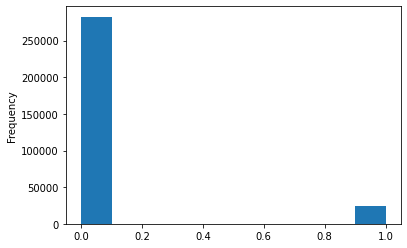

In [24]:
datasets["application_train"]['TARGET'].astype(int).plot.hist();

**This shows that around 8% of people are not able to repay the loans back.**

In [25]:
datasets["application_train"]['TARGET'].value_counts()/datasets["application_train"]['TARGET'].shape[0]

0    0.919271
1    0.080729
Name: TARGET, dtype: float64

## Correlation with  the target column 

In [25]:
def correlation_against_target(df):
    df_joined = {} 
    df_joined =  datasets['application_train'][["SK_ID_CURR", "TARGET"]].merge(df, on='SK_ID_CURR', how='right')
    cols = df.columns
    keys = list(df.columns)
    keys.append("TARGET")
    return df_joined[keys].corr()['TARGET'].sort_values(ascending=False)

## Correlations against the target on the Original Tables

In [17]:
original_corr = {}
#barplot
for i,ds_name in enumerate(datasets.keys()):
    if(ds_name.upper() != "APPLICATION_TRAIN"):
        if (ds_name.upper() != "APPLICATION_TEST"):
            if (ds_name.upper() != "BUREAU_BALANCE"):
                if (ds_name.upper() == "bureau"):
                    if 'AMT_ANNUITY' in datasets["bureau"].columns:
                        datasets["bureau"] = datasets["bureau"].drop(["AMT_ANNUITY"], axis = 1)
                print("------------------------------------------------------------------------")
                print("Correlation for Orignal Table:", ds_name.upper())
                print("------------------------------------------------------------------------")
                ds = correlation_against_target(datasets[ds_name])
                print("------------------------------------------------------------------------")
                original_corr[ds_name] = ds
                print(ds)
                print("------------------------------------------------------------------------")
                print("------------------------------------------------------------------------")

------------------------------------------------------------------------
Correlation for Orignal Table: BUREAU
------------------------------------------------------------------------
['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY', 'TARGET']
------------------------------------------------------------------------
TARGET                    1.000000
DAYS_CREDIT               0.061556
DAYS_CREDIT_UPDATE        0.041076
DAYS_ENDDATE_FACT         0.039057
DAYS_CREDIT_ENDDATE       0.026497
AMT_CREDIT_SUM_OVERDUE    0.006253
CREDIT_DAY_OVERDUE        0.002652
AMT_CREDIT_SUM_DEBT       0.002539
AMT_CREDIT_MAX_OVERDUE    0.001587
CNT_CREDIT_PROLONG        0.001523
AMT_ANNUITY               0.000117
SK_ID_CUR

## Correlations on the Transformed Tables done with a right merge against the table 

In [26]:
transformed_corr = {}
for i,ds_name in enumerate(datasets_transformed.keys()):
    datasets_transformed[ds_name].reset_index()
    if(ds_name.upper() != "APPLICATION_TRAIN"):
        if (ds_name.upper() != "APPLICATION_TEST"):
            # SK_ID_CURR NOT SHOWING ON MY SYSTEM JUST COMMENT OUR BELOW LINE SAHIL
            if (ds_name.upper() != "POS_CASH_BALANCE"):
                if (ds_name.upper() != "BUREAU_BALANCE"):        
                    print("------------------------------------------------------------------------")
                    print("Correlation for Transformed Table:", ds_name.upper())
                    print("------------------------------------------------------------------------")
                    ds = correlation_against_target(datasets_transformed[ds_name])
                    print("------------------------------------------------------------------------")
                    transformed_corr[ds_name] = ds
                    print(ds)
                    print("------------------------------------------------------------------------")
                    print("------------------------------------------------------------------------")

------------------------------------------------------------------------
Correlation for Transformed Table: PREVIOUS_APPLICATION
------------------------------------------------------------------------
------------------------------------------------------------------------
TARGET                                           1.000000
NAME_CONTRACT_STATUS_Refused_mean                0.077671
NAME_CONTRACT_STATUS_Refused_var                 0.075867
CODE_REJECT_REASON_XAP_var                       0.071560
NAME_CONTRACT_STATUS_Refused_median              0.064930
                                                   ...   
PREV_REJ_CNT_var                                      NaN
NAME_GOODS_CATEGORY_Animals_median                    NaN
NAME_GOODS_CATEGORY_House Construction_median         NaN
NAME_GOODS_CATEGORY_House Construction_mean           NaN
NAME_GOODS_CATEGORY_House Construction_var            NaN
Name: TARGET, Length: 601, dtype: float64
---------------------------------------------

## Highest Correlations on Original Tables

The below gives you the highest correlated attributes from each table with a threshold of .7. This is correlation to other attributes in the same table. 

In [27]:
# Get high correlated variables
def high_correlation(data, remove=['SK_ID_CURR', 'SK_ID_BUREAU'], corr_coef="pearson", corr_value = 0.7):
    if len(remove) > 0:
        cols = [x for x in data.columns if (x not in remove)]
        c = data[cols].corr(method=corr_coef)
    else:
        c = data.corr(method=corr_coef)

    for i in c.columns:
        cr = c.loc[i].loc[(c.loc[i] >= corr_value) | (c.loc[i] <= -corr_value)].drop(i)
        if len(cr) > 0:
            print(i)
            print("-------------------------------")
            print(cr.sort_values(ascending=False))
            print("\n")

In [36]:
datasets["application_train"]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [38]:
for i,ds_name in enumerate(datasets.keys()):
    print("------------------------------------------------------------------------")
    print("Table under consideration FOR HIGHEST CORRELATIONS:",ds_name.upper())
    high_correlation(datasets[ds_name], remove=['SK_ID_CURR','SK_ID_BUREAU', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_10', 
                                                'FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14',
                                               'FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17',
                                               'FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20',
                                               'FLAG_DOCUMENT_21','PREV_REJ_CNT'], corr_coef = "spearman", corr_value = 0.7)
    print("------------------------------------------------------------------------")
    print("------------------------------------------------------------------------")


------------------------------------------------------------------------
Table under consideration FOR HIGHEST CORRELATIONS: APPLICATION_TRAIN
CNT_CHILDREN
-------------------------------
CNT_FAM_MEMBERS    0.811559
Name: CNT_CHILDREN, dtype: float64


AMT_CREDIT
-------------------------------
AMT_GOODS_PRICE    0.984898
AMT_ANNUITY        0.830225
Name: AMT_CREDIT, dtype: float64


AMT_ANNUITY
-------------------------------
AMT_CREDIT         0.830225
AMT_GOODS_PRICE    0.828034
Name: AMT_ANNUITY, dtype: float64


AMT_GOODS_PRICE
-------------------------------
AMT_CREDIT     0.984898
AMT_ANNUITY    0.828034
Name: AMT_GOODS_PRICE, dtype: float64


CNT_FAM_MEMBERS
-------------------------------
CNT_CHILDREN    0.811559
Name: CNT_FAM_MEMBERS, dtype: float64


REGION_RATING_CLIENT
-------------------------------
REGION_RATING_CLIENT_W_CITY    0.950041
Name: REGION_RATING_CLIENT, dtype: float64


REGION_RATING_CLIENT_W_CITY
-------------------------------
REGION_RATING_CLIENT    0.9500

In [26]:
correlations = datasets["application_train"].corr()['TARGET'].sort_values()
print('Most Positive Correlations:\n', correlations.tail(10))
print('\nMost Negative Correlations:\n', correlations.head(10))

Most Positive Correlations:
 FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
ELEVATORS_AVG                -0.034199
Name: TARGET, dtype: float64


## Applicants Age 

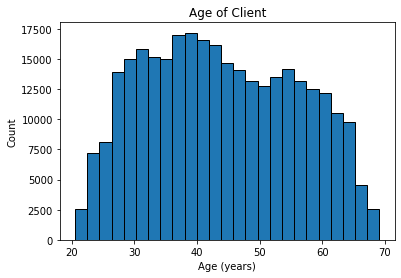

In [27]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

## Applicants occupations

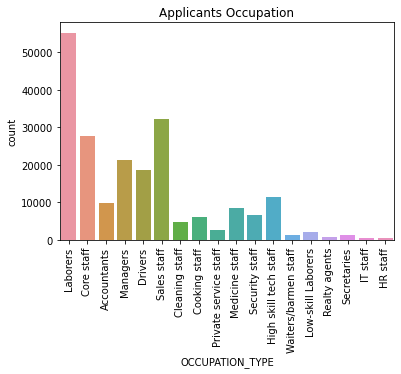

In [28]:
sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"]);
plt.title('Applicants Occupation');
plt.xticks(rotation=90);

**17% of our applicants are labourers and around 10% are from the Sales. This seems like folks which are from the lower income range which apply for the loan.**

In [29]:
100* datasets["application_train"]['OCCUPATION_TYPE'].value_counts()/datasets["application_train"]['OCCUPATION_TYPE'].shape[0]

Laborers                 17.946025
Sales staff              10.439301
Core staff                8.965533
Managers                  6.949670
Drivers                   6.049540
High skill tech staff     3.700681
Accountants               3.191105
Medicine staff            2.776161
Security staff            2.185613
Cooking staff             1.933589
Cleaning staff            1.513117
Private service staff     0.862408
Low-skill Laborers        0.680626
Waiters/barmen staff      0.438358
Secretaries               0.424375
Realty agents             0.244219
HR staff                  0.183083
IT staff                  0.171051
Name: OCCUPATION_TYPE, dtype: float64

# Dataset questions
## Unique record for each SK_ID_CURR

## previous applications for the submission file
The persons in the kaggle submission file have had previous applications in the `previous_application.csv`. 47,800 out 48,744 people have had previous appications.

In [49]:
appsDF = datasets["previous_application"]

In [50]:
len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"]))

47800

In [51]:
print(f"There are  {appsDF.shape[0]:,} previous applications")

There are  1,670,214 previous applications


In [52]:
# How many entries are there for each month?
prevAppCounts = appsDF['SK_ID_CURR'].value_counts(dropna=False)
#appsDF
prevAppCounts

187868    77
265681    73
173680    72
242412    68
206783    67
          ..
135285     1
311960     1
427136     1
241434     1
191629     1
Name: SK_ID_CURR, Length: 338857, dtype: int64

In [53]:
len(prevAppCounts[prevAppCounts >40])  #more that 40 previous applications

101

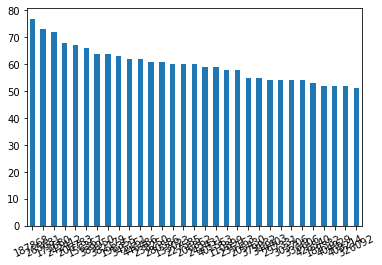

In [54]:
prevAppCounts[prevAppCounts >50].plot(kind='bar')
plt.xticks(rotation=25)
plt.show()

### Histogram of Number of previous applications for an ID

In [55]:
sum(appsDF['SK_ID_CURR'].value_counts()==1)

60458

Text(0.5, 1.0, 'Histogram of Number of previous applications for an ID')

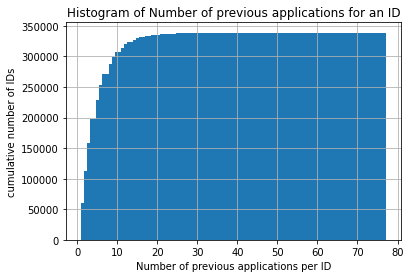

In [56]:
plt.hist(appsDF['SK_ID_CURR'].value_counts(), cumulative =True, bins = 100);
plt.grid()
plt.ylabel('cumulative number of IDs')
plt.xlabel('Number of previous applications per ID')
plt.title('Histogram of Number of previous applications for an ID')


##### **Can we differentiate applications by low, medium and high previous apps?**
    * Low = <5 claims (22%)
    * Medium = 10 to 39 claims (58%)
    * High = 40 or more claims (20%)

In [57]:
apps_all = appsDF['SK_ID_CURR'].nunique()
apps_5plus = appsDF['SK_ID_CURR'].value_counts()>=5
#print(apps_5plus)
apps_40plus = appsDF['SK_ID_CURR'].value_counts()>=40
apps_med_plus = 100 - apps_5plus- apps_40plus
print('Percentage with 10 or more previous apps:', np.round(100.*(sum(apps_5plus)/apps_all),5))
print('Percentage with 11 to 39 no of apps:', np.round(100-(100.*(sum(apps_5plus)/apps_all))-(100.*(sum(apps_40plus)/apps_all)),5))
print('Percentage with 40 or more previous apps:', np.round(100.*(sum(apps_40plus)/apps_all),5))


Percentage with 10 or more previous apps: 41.76895
Percentage with 11 to 39 no of apps: 58.19653
Percentage with 40 or more previous apps: 0.03453


In [58]:
df1 = pd.DataFrame(prevAppCounts)
df1

,SK_ID_CURR
187868,77
265681,73
173680,72
242412,68
206783,67
...,...
135285,1
311960,1
427136,1
241434,1


# Joining secondary tables with the primary table

In the case of the HCDR competition (and many other machine learning problems that involve multiple tables in 3NF or not)  we need to join these datasets (denormalize) when using a machine learning pipeline. Joining the secondary tables with the primary table will lead to lots of new features about each loan application; these features will tend to be aggregate type features or meta data about the loan or its application. How can we do this when using Machine Learning Pipelines?

## Joining `previous_application` with `application_x`
We refer to the `application_train` data (and also `application_test` data also) as the **primary table** and the other files as the **secondary tables** (e.g., `previous_application` dataset). All tables can be joined using the primary key `SK_ID_PREV`.

Let's assume we wish to generate a feature based on previous application attempts. In this case, possible features here could be:

* A simple feature could be the number of previous applications.
* Other summary features of original features such as `AMT_APPLICATION`, `AMT_CREDIT` could be based on average, min, max, median, etc.
 
To build such features, we need to join the `application_train` data (and also `application_test` data also) with the 'previous_application' dataset (and the other available datasets).

When joining this data in the context of pipelines, different strategies come to mind with various tradeoffs:

1. Preprocess each of the non-application data sets, thereby generating many new (derived) features, and then joining (aka merge) the results with the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset) prior to processing the data (in a train, valid, test partition) via your machine learning pipeline. [This approach is recommended for this HCDR competition. WHY?]

* Do the joins as part of the transformation steps. [Not recommended here. WHY?]. How can this be done? Will it work?
  * This would be necessary if we had dataset wide features such as IDF (inverse document frequency) which depend on the entire subset of data as opposed to a single loan application (e.g., a feature about the relative amount applied for such as the percentile of the loan amount being applied for).
 
I want you to think about this section and build on this.

In [59]:
 pd.DataFrame(prevAppCounts)

,SK_ID_CURR
187868,77
265681,73
173680,72
242412,68
206783,67
...,...
135285,1
311960,1
427136,1
241434,1


## Roadmap for secondary table processing

1. Transform all the secondary tables to features that can be joined into the main table the application table (labeled and unlabeled)
   * 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
   * 'previous_application', 'POS_CASH_balance'
* Merge the transformed secondary tables with the primary tables (i.e., the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset)), thereby leading to X_train, y_train, X_valid, etc.
* Proceed with the learning pipeline using X_train, y_train, X_valid, etc.
* Generate a submission file using the learnt model


## agg detour

Aggregate using one or more operations over the specified axis.

For more details see [agg](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.agg.html)
```python
DataFrame.agg(func, axis=0, *args, **kwargs**)
```
Aggregate using one or more operations over the specified axis.


In [60]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

### Multiple condition expressions in Pandas
So far, both our boolean selections have involved a single condition. You can, of course, have as many conditions as you would like. To do so, you will need to combine your boolean expressions using the three logical operators and, or and not.

Use &, | , ~
Although Python uses the syntax and, or, and not, these will not work when testing multiple conditions with pandas. The details of why are explained [here](https://medium.com/dunder-data/selecting-subsets-of-data-in-pandas-39e811c81a0c).

You must use the following operators with pandas:

* & for and
* | for or
* ~ for not

## Missing values in prevApps

In [61]:
appsDF.isna().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [62]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

## feature engineering for prevApp table

In [63]:
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
print(f"{appsDF[features].describe()}")
agg_ops = ["min", "max", "mean"]
result = appsDF.groupby(["SK_ID_CURR"], as_index=False).agg("mean") #group by ID
display(result.head())
print("-"*50)
result = appsDF.groupby(["SK_ID_CURR"], as_index=False).agg({'AMT_ANNUITY' : agg_ops, 'AMT_APPLICATION' : agg_ops})
result.columns = result.columns.map('_'.join)
display(result)
result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
print(f"result.shape: {result.shape}")
result[0:10]

        AMT_ANNUITY  AMT_APPLICATION
count  1.297979e+06     1.670214e+06
mean   1.595512e+04     1.752339e+05
std    1.478214e+04     2.927798e+05
min    0.000000e+00     0.000000e+00
25%    6.321780e+03     1.872000e+04
50%    1.125000e+04     7.104600e+04
75%    2.065842e+04     1.803600e+05
max    4.180581e+05     6.905160e+06


,SK_ID_CURR,SK_ID_PREV,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100001,1.369693e+06,3951.000,24835.50,23787.00,2520.0,24835.5,13.000000,1.0,0.104326,...,NaN,-1740.0,23.0,8.0,365243.0,-1709.000000,-1499.000000,-1619.000000,-1612.000000,0.000000
1,100002,1.038818e+06,9251.775,179055.00,179055.00,0.0,179055.0,9.000000,1.0,0.000000,...,NaN,-606.0,500.0,24.0,365243.0,-565.000000,125.000000,-25.000000,-17.000000,0.000000
2,100003,2.281150e+06,56553.990,435436.50,484191.00,3442.5,435436.5,14.666667,1.0,0.050030,...,NaN,-1305.0,533.0,10.0,365243.0,-1274.333333,-1004.333333,-1054.333333,-1047.333333,0.666667
3,100004,1.564014e+06,5357.250,24282.00,20106.00,4860.0,24282.0,5.000000,1.0,0.212008,...,NaN,-815.0,30.0,4.0,365243.0,-784.000000,-694.000000,-724.000000,-714.000000,0.000000
4,100005,2.176837e+06,4813.200,22308.75,20076.75,4464.0,44617.5,10.500000,1.0,0.108964,...,NaN,-536.0,18.0,12.0,365243.0,-706.000000,-376.000000,-466.000000,-460.000000,0.000000


--------------------------------------------------


,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750
...,...,...,...,...,...,...,...
338852,456251,6605.910,6605.910,6605.910000,40455.0,40455.0,40455.000
338853,456252,10074.465,10074.465,10074.465000,57595.5,57595.5,57595.500
338854,456253,3973.095,5567.715,4770.405000,19413.0,28912.5,24162.750
338855,456254,2296.440,19065.825,10681.132500,18846.0,223789.5,121317.750


result.shape: (338857, 8)


,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean,range_AMT_APPLICATION
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500000,0.0
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000000,0.0
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500000,831190.5
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000000,0.0
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750000,44617.5
5,100006,2482.920,39954.510,23651.175000,0.0,688500.0,272203.260000,688500.0
6,100007,1834.290,22678.785,12278.805000,17176.5,247500.0,150530.250000,230323.5
7,100008,8019.090,25309.575,15839.696250,0.0,450000.0,155701.800000,450000.0
8,100009,7435.845,17341.605,10051.412143,40455.0,110160.0,76741.714286,69705.0
9,100010,27463.410,27463.410,27463.410000,247212.0,247212.0,247212.000000,0.0


In [64]:
result.isna().sum()

SK_ID_CURR_                0
AMT_ANNUITY_min          480
AMT_ANNUITY_max          480
AMT_ANNUITY_mean         480
AMT_APPLICATION_min        0
AMT_APPLICATION_max        0
AMT_APPLICATION_mean       0
range_AMT_APPLICATION      0
dtype: int64

In [65]:
result

,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean,range_AMT_APPLICATION
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500,0.0
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000,0.0
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500,831190.5
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000,0.0
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750,44617.5
...,...,...,...,...,...,...,...,...
338852,456251,6605.910,6605.910,6605.910000,40455.0,40455.0,40455.000,0.0
338853,456252,10074.465,10074.465,10074.465000,57595.5,57595.5,57595.500,0.0
338854,456253,3973.095,5567.715,4770.405000,19413.0,28912.5,24162.750,9499.5
338855,456254,2296.440,19065.825,10681.132500,18846.0,223789.5,121317.750,204943.5


## feature transformer for prevApp table

In [66]:
# Create aggregate features (via pipeline)
class prevAppsFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
    
        self.features = features
        self.agg_ops = ["min", "max", "mean"]



    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        result = X.groupby(["SK_ID_CURR"], as_index=False).agg({ft:self.agg_ops for ft in self.features})
        result.columns = result.columns.map(lambda ct: '_'.join([x for x in ct if x != '']))
        
        if 'AMT_APPLICATION' in features:
            result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
        return result 
        
    

from sklearn.pipeline import make_pipeline 
def test_driver_prevAppsFeaturesAggregater(df, features):
    print(f"df.shape: {df.shape}\n")
    print(f"df[{features}][0:5]: \n{df[features][0:5]}")
    test_pipeline = make_pipeline(prevAppsFeaturesAggregater(features))
    return(test_pipeline.fit_transform(df))

## Sd - removed name payment type for now.
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
features = ['AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', #'NAME_PAYMENT_TYPE',
       'CNT_PAYMENT', 
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION']
#features = ['AMT_ANNUITY', 'AMT_APPLICATION']
res = test_driver_prevAppsFeaturesAggregater(appsDF, features)
print(f"HELLO")
print(f"Test driver: \n{res[0:10]}")
print(f"input[features][0:10]: \n{appsDF[0:10]}")

# QUESTION, should we lower case df['OCCUPATION_TYPE'] as Sales staff != 'Sales Staff'? (hint: YES)


df.shape: (1670214, 37)

df[['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION']][0:5]: 
   AMT_ANNUITY  AMT_APPLICATION  AMT_CREDIT  AMT_DOWN_PAYMENT  \
0     1730.430          17145.0     17145.0               0.0   
1    25188.615         607500.0    679671.0               NaN   
2    15060.735         112500.0    136444.5               NaN   
3    47041.335         450000.0    470790.0               NaN   
4    31924.395         337500.0    404055.0               NaN   

   AMT_GOODS_PRICE  RATE_DOWN_PAYMENT  RATE_INTEREST_PRIMARY  \
0          17145.0                0.0               0.182832   
1         607500.0                NaN                    NaN   
2         112500.0                NaN                    NaN   
3         450000.

## Join the labeled dataset

In [67]:
prevApps_aggregated = prevAppsFeaturesAggregater(features).transform(appsDF)


In [68]:
prevApps_aggregated['prev_app_cnt'] = pd.DataFrame(prevAppCounts)

In [69]:
prevApps_aggregated['prev_app_cnt']

0          NaN
1          NaN
2          NaN
3          NaN
4          NaN
          ... 
338852     3.0
338853    13.0
338854     6.0
338855    13.0
338856     4.0
Name: prev_app_cnt, Length: 338857, dtype: float64

In [70]:

appTrain = datasets['application_train']
appTest = datasets['application_test']
y_train = appTrain['TARGET']
X_train = appTrain
appTrain = appTrain.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')
appTest = appTest.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')

In [71]:
X_kaggle_test= appTest

In [73]:
datasets.keys()

dict_keys(['application_train', 'application_test', 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 'previous_application', 'POS_CASH_balance'])

## Join the unlabeled dataset (i.e., the submission file)

In [74]:
# approval rate 'NFLAG_INSURED_ON_APPROVAL'

In [75]:
# Convert categorical features to numerical approximations (via pipeline)
class ClaimAttributesAdder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None): 
        charlson_idx_dt = {'0': 0, '1-2': 2, '3-4': 4, '5+': 6}
        los_dt = {'1 day': 1, '2 days': 2, '3 days': 3, '4 days': 4, '5 days': 5, '6 days': 6,
          '1- 2 weeks': 11, '2- 4 weeks': 21, '4- 8 weeks': 42, '26+ weeks': 180}
        X['PayDelay'] = X['PayDelay'].apply(lambda x: int(x) if x != '162+' else int(162))
        X['DSFS'] = X['DSFS'].apply(lambda x: None if pd.isnull(x) else int(x[0]) + 1)
        X['CharlsonIndex'] = X['CharlsonIndex'].apply(lambda x: charlson_idx_dt[x])
        X['LengthOfStay'] = X['LengthOfStay'].apply(lambda x: None if pd.isnull(x) else los_dt[x])
        return X
    
    


# Processing pipeline

###  OHE when previously unseen unique values in the test/validation set

Train, validation and Test sets (and the leakage problem we have mentioned previously):

 

Let's look at a small usecase to tell us how to deal with this:

* The OneHotEncoder is fitted to the training set, which means that for each unique value present in the training set, for each feature, a new column is created. Let's say we have 39 columns after the encoding up from 30 (before preprocessing).
* The output is a numpy array (when the option sparse=False is used), which has the disadvantage of losing all the information about the original column names and values.
* When we try to transform the test set, after having fitted the encoder to the training set, we obtain a `ValueError`. This is because the there are new, previously unseen unique values in the test set and the encoder doesn’t know how to handle these values. In order to use both the transformed training and test sets in machine learning algorithms, we need them to have the same number of columns.

This last problem can be solved by using the option handle_unknown='ignore'of the OneHotEncoder, which, as the name suggests, will ignore previously unseen values when transforming the test set.

 

Here is a example that in action:

```python
# Identify the categorical features we wish to consider.
cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
               'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

```


In [76]:
datasets["application_train"]['TARGET']

0         1
1         0
2         0
3         0
4         0
         ..
307506    0
307507    0
307508    0
307509    1
307510    0
Name: TARGET, Length: 307511, dtype: int64

Please [this  blog](https://medium.com/hugo-ferreiras-blog/dealing-with-categorical-features-in-machine-learning-1bb70f07262d) for more details of OHE when the validation/test have previously unseen unique values.

## HCDR preprocessing

In [77]:
# Split the provided training data into training and validationa and test
# The kaggle evaluation test set has no labels
#
from sklearn.model_selection import train_test_split


appTrain = datasets['application_train']
appTest = datasets['application_test']
y_train = appTrain['TARGET']
X_train = appTrain
appTrain = appTrain.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')
appTest = appTest.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')

use_application_data_ONLY = False#use joined data
if use_application_data_ONLY:
    # just selected a few features for a baseline experiment
    selected_features = ['AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1',
        'EXT_SOURCE_2','EXT_SOURCE_3','CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
                   'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']
    X_train = datasets["application_train"][selected_features]
    y_train = datasets["application_train"]['TARGET']
    X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
    X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
    X_kaggle_test= datasets["application_test"][selected_features]
    # y_test = datasets["application_test"]['TARGET']   #why no  TARGET?!! (hint: kaggle competition)

selected_features = ['AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1',
        'EXT_SOURCE_2','EXT_SOURCE_3','CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
                   'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']
y_train = X_train['TARGET']
X_train = X_train[selected_features]
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
X_kaggle_test= X_kaggle_test[selected_features]
# y_test = datasets["application_test"]['TARGET']   #why no  TARGET?!! (hint: kaggle competition)

    
print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")
print(f"X X_kaggle_test   shape: {X_kaggle_test.shape}")

X train           shape: (222176, 14)
X validation      shape: (46127, 14)
X test            shape: (39208, 14)
X X_kaggle_test   shape: (48744, 14)


In [78]:
from sklearn.base import BaseEstimator, TransformerMixin
import re

# Creates the following date features
# But could do so much more with these features
#    E.g., 
#      extract the domain address of the homepage and OneHotEncode it
# 
# ['release_month','release_day','release_year', 'release_dayofweek','release_quarter']
class prep_OCCUPATION_TYPE(BaseEstimator, TransformerMixin):
    def __init__(self, features="OCCUPATION_TYPE"): # no *args or **kargs
        self.features = features
    def fit(self, X, y=None):
        return self  # nothing else to do
    def transform(self, X):
        df = pd.DataFrame(X, columns=self.features)
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        df['OCCUPATION_TYPE'] = df['OCCUPATION_TYPE'].apply(lambda x: 1. if x in ['Core Staff', 'Accountants', 'Managers', 'Sales Staff', 'Medicine Staff', 'High Skill Tech Staff', 'Realty Agents', 'IT Staff', 'HR Staff'] else 0.)   
        #df.drop(self.features, axis=1, inplace=True)
        return np.array(df.values)  #return a Numpy Array to observe the pipeline protocol
    

from sklearn.pipeline import make_pipeline 
features = ["OCCUPATION_TYPE"]
def test_driver_prep_OCCUPATION_TYPE():
    print(f"X_train.shape: {X_train.shape}\n")
    print(f"X_train['name'][0:5]: \n{X_train[features][0:5]}")
    test_pipeline = make_pipeline(prep_OCCUPATION_TYPE(features))
    return(test_pipeline.fit_transform(X_train))
          
x = test_driver_prep_OCCUPATION_TYPE()
print(f"Test driver: \n{test_driver_prep_OCCUPATION_TYPE()[0:10, :]}")
print(f"X_train['name'][0:10]: \n{X_train[features][0:10]}")


# QUESTION, should we lower case df['OCCUPATION_TYPE'] as Sales staff != 'Sales Staff'? (hint: YES)


X_train.shape: (222176, 14)

X_train['name'][0:5]: 
       OCCUPATION_TYPE
21614      Sales staff
209797        Laborers
17976              NaN
282543  Security staff
52206              NaN
X_train.shape: (222176, 14)

X_train['name'][0:5]: 
       OCCUPATION_TYPE
21614      Sales staff
209797        Laborers
17976              NaN
282543  Security staff
52206              NaN
Test driver: 
[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [0.]
 [0.]]
X_train['name'][0:10]: 
       OCCUPATION_TYPE
21614      Sales staff
209797        Laborers
17976              NaN
282543  Security staff
52206              NaN
152195        Managers
70364       Core staff
11643              NaN
45591       Core staff
93535         Laborers


In [79]:
# Create a class to select numerical or categorical columns 
# since Scikit-Learn doesn't handle DataFrames yet
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values

# Baseline Model

To get a baseline, we will use some of the features after being preprocessed through the pipeline.
The baseline model is a logistic regression model

## Baseline with 14 features

In [80]:
# Identify the numeric features we wish to consider. 
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.datasets import load_iris
import numpy as np
import pandas as pd
from time import time
from sklearn.model_selection import train_test_split  # sklearn.cross_validation in old versions
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score

num_attribs = [
    'AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1',
    'EXT_SOURCE_2','EXT_SOURCE_3']

num_pipeline = Pipeline([
        ('selector', DataFrameSelector(num_attribs)),
        ('imputer', SimpleImputer(strategy='mean')),
        ('std_scaler', StandardScaler()),
    ])
# Identify the categorical features we wish to consider.
cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
               'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

selected_features = num_attribs + cat_attribs
# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        #('imputer', SimpleImputer(strategy='most_frequent')),
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

data_pipeline = ColumnTransformer(transformers=[
        ("num_pipeline", num_pipeline, num_attribs),
        ("cat_pipeline", cat_pipeline, cat_attribs)],
        remainder='drop',
        n_jobs=-1
    )


full_pipeline_with_predictor = Pipeline([
        ("preparation", data_pipeline),
        ("linear", LogisticRegression())
    ])

param_grid = {'linear__penalty':[#'l1', 'l2', 'elasticnet',
                                 'none']
              #,'linear__C':[1.0#, 10.0, 100.0 ]
             }

gd2 = GridSearchCV(full_pipeline_with_predictor, param_grid= param_grid, cv = 5, n_jobs=-1, scoring='roc_auc')

model = gd2.fit(X_train, y_train)


try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC"
                                  ])

exp_name = f"Baseline_{len(selected_features)}_features"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model.predict(X_train)), 
                accuracy_score(y_valid, model.predict(X_valid)),
                accuracy_score(y_test, model.predict(X_test)),
                roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]),
                roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])],
    4)) 
expLog


,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
0,Baseline_14_features,0.9198,0.9192,0.9158,0.7358,0.7358,0.7357


## Split train, validation and test sets

In [81]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

data = datasets["application_train"]
y = data['TARGET']
X = data.drop(['SK_ID_CURR', 'TARGET'], axis = 1) #drop some features with questionable value

# Split the provided training data into training and validationa and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")

X train           shape: (209107, 120)
X validation      shape: (52277, 120)
X test            shape: (46127, 120)


## Baseline 2:  All features

In [82]:
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.datasets import load_iris
import numpy as np
import pandas as pd
from time import time
from sklearn.model_selection import train_test_split  # sklearn.cross_validation in old versions
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score


data = datasets["application_train"]
y = data['TARGET']
X = data.drop(['SK_ID_CURR', 'TARGET'], axis = 1) #drop some features with questionable value

# Split the provided training data into training and validationa and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")

numerical_features = list(numerical_ix[2:])

num_pipeline =Pipeline([
    ('imputer',SimpleImputer(strategy="median")),
    ('std_scaler', StandardScaler())
])
categorical_features = list(categorical_ix)

selected_features = (numerical_features) + (categorical_features)

cat_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])


data_pipeline = ColumnTransformer(transformers=[
        ("num_pipeline", num_pipeline, numerical_features),
        ("cat_pipeline", cat_pipeline, categorical_features)],
        remainder='drop',
        n_jobs=-1
    )


full_pipeline_with_predictor = Pipeline([
        ("preparation", data_pipeline),
        ("linear", LogisticRegression())
    ])

param_grid = {'linear__penalty':[#'l1', 'l2', 'elasticnet',
                                 'none']
              #,'linear__C':[1.0#, 10.0, 100.0]
             }

gd1 = GridSearchCV(full_pipeline_with_predictor, param_grid= param_grid, cv = 5, n_jobs=-1, scoring='roc_auc')

model = gd1.fit(X_train, y_train)


try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC"
                                  ])

exp_name = f"Baseline_{len(selected_features)}_features"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model.predict(X_train)), 
                accuracy_score(y_valid, model.predict(X_valid)),
                accuracy_score(y_test, model.predict(X_test)),
                roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]),
                roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])],
    4)) 
expLog

X train           shape: (209107, 120)
X validation      shape: (52277, 120)
X test            shape: (46127, 120)


,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
0,Baseline_14_features,0.9198,0.9192,0.9158,0.7358,0.7358,0.7357
1,Baseline_120_features,0.9200,0.9163,0.9193,0.7478,0.7472,0.7434


## Baseline 3: 79 Features
**Selected Features**

**Remove elements with more than 50% nulls**

In [83]:
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.datasets import load_iris
import numpy as np
import pandas as pd
from time import time
from sklearn.model_selection import train_test_split  # sklearn.cross_validation in old versions
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score


data = datasets["application_train"]
y = data['TARGET']
X = data.drop(['SK_ID_CURR', 'TARGET'], axis = 1) #drop some features with questionable value

# Split the provided training data into training and validationa and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")

numerical_features = list(numerical_ix[2:].drop(remove_num_nulls))

num_pipeline =Pipeline([
    ('imputer',SimpleImputer(strategy="median")),
    ('std_scaler', StandardScaler())
])
categorical_features = list(categorical_ix.drop(remove_cat_nulls))

selected_features = (numerical_features) + (categorical_features)

cat_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])


data_pipeline = ColumnTransformer(transformers=[
        ("num_pipeline", num_pipeline, numerical_features),
        ("cat_pipeline", cat_pipeline, categorical_features)],
        remainder='drop',
        n_jobs=-1
    )


full_pipeline_with_predictor = Pipeline([
        ("preparation", data_pipeline),
        ("linear", LogisticRegression())
    ])

param_grid = {'linear__penalty':[#'l1', 'l2', 'elasticnet',
                                 'none']
              #,'linear__C':[1.0#, 10.0, 100.0]
                            }

gd3 = GridSearchCV(full_pipeline_with_predictor, param_grid= param_grid, cv = 5, n_jobs=-1, scoring='roc_auc')

model = gd3.fit(X_train, y_train)


try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC"
                                  ])

exp_name = f"Baseline_{len(selected_features)}_features"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model.predict(X_train)), 
                accuracy_score(y_valid, model.predict(X_valid)),
                accuracy_score(y_test, model.predict(X_test)),
                roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]),
                roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])],
    4)) 
expLog

X train           shape: (209107, 120)
X validation      shape: (52277, 120)
X test            shape: (46127, 120)


,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
0,Baseline_14_features,0.9198,0.9192,0.9158,0.7358,0.7358,0.7357
1,Baseline_120_features,0.9200,0.9163,0.9193,0.7478,0.7472,0.7434
2,Baseline_79_features,0.9200,0.9164,0.9195,0.7441,0.7442,0.7406


## Baseline 4 : 79 features; 2 log features

**Remove elements with more than 50% nulls with log AMT_ANNUITY and AMT_CREDIT **

In [84]:

data = datasets["application_train"]
y = data['TARGET']
X = data.drop(['SK_ID_CURR', 'TARGET'], axis = 1) #drop some features with questionable value
X['LOG_AMT_ANNUITY'] = np.log(X['AMT_ANNUITY']) #add LOG_AMT_ANNUITY colunm
X = X.drop(['AMT_ANNUITY'], axis = 1) # drop AMT_ANNUITY colunm
X['LOG_AMT_CREDIT'] = np.log(X['AMT_CREDIT']) #add LOG_AMT_ANNUITY colunm
X = X.drop(['AMT_CREDIT'], axis = 1) # drop AMT_ANNUITY colunm

# Split the provided training data into training and validationa and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")

numerical_features = list(numerical_ix[2:].drop(remove_num_nulls))
numerical_features.append('LOG_AMT_ANNUITY')
numerical_features.append('LOG_AMT_CREDIT')
numerical_features.remove('AMT_CREDIT')
numerical_features.remove('AMT_ANNUITY')


num_pipeline =Pipeline([
    ('imputer',SimpleImputer(strategy="median")),
    ('std_scaler', StandardScaler())
])
     
categorical_features =  list(categorical_ix.drop(remove_cat_nulls))

selected_features = (numerical_features) + (categorical_features)

cat_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])


data_pipeline = ColumnTransformer(transformers=[
        ("num_pipeline", num_pipeline, numerical_features),
        ("cat_pipeline", cat_pipeline, categorical_features)],
        remainder='drop',
        n_jobs=-1
    )


full_pipeline_with_predictor = Pipeline([
        ("preparation", data_pipeline),
        ("linear", LogisticRegression())
    ])

param_grid = {'linear__penalty':[#'l1', 'l2', 'elasticnet',
                                 'none']
              #,'linear__C':[1.0#, 10.0, 100.0]
             }

gd4 = GridSearchCV(full_pipeline_with_predictor, param_grid= param_grid, cv = 5, n_jobs=-1, scoring='roc_auc')

model = gd4.fit(X_train, y_train)


try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC"
                                  ])

exp_name = f"Baseline_{len(selected_features)}_features with log attributes"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model.predict(X_train)), 
                accuracy_score(y_valid, model.predict(X_valid)),
                accuracy_score(y_test, model.predict(X_test)),
                roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]),
                roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])],
    4)) 
expLog

X train           shape: (209107, 120)
X validation      shape: (52277, 120)
X test            shape: (46127, 120)


,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC
0,Baseline_14_features,0.9198,0.9192,0.9158,0.7358,0.7358,0.7357
1,Baseline_120_features,0.9200,0.9163,0.9193,0.7478,0.7472,0.7434
2,Baseline_79_features,0.9200,0.9164,0.9195,0.7441,0.7442,0.7406
3,Baseline_79_features with log attributes,0.9200,0.9164,0.9195,0.7443,0.7447,0.7405


# Submission File Prep

For each SK_ID_CURR in the test set, you must predict a probability for the TARGET variable. The file should contain a header and have the following format:

```python 
SK_ID_CURR,TARGET
100001,0.1
100005,0.9
100013,0.2
etc.
```

In [85]:
data_test = datasets["application_test"]
print(data_test.shape)

X_Kaggle_test = data_test.drop('SK_ID_CURR', axis = 1)
test_class_scores = gd3.predict_proba(X_Kaggle_test)[:, 1]

submit_df = datasets["application_test"][['SK_ID_CURR']]
submit_df['TARGET'] = test_class_scores

submit_df.head()

(48744, 121)


,SK_ID_CURR,TARGET
0,100001,0.079261
1,100005,0.256575
2,100013,0.050367
3,100028,0.029005
4,100038,0.096225


In [86]:
submit_df.to_csv("submission.csv",index=False)

## report submission

Click on this [link](https://www.kaggle.com/c/home-credit-default-risk/submissions?sortBy=date&group=all&page=1)

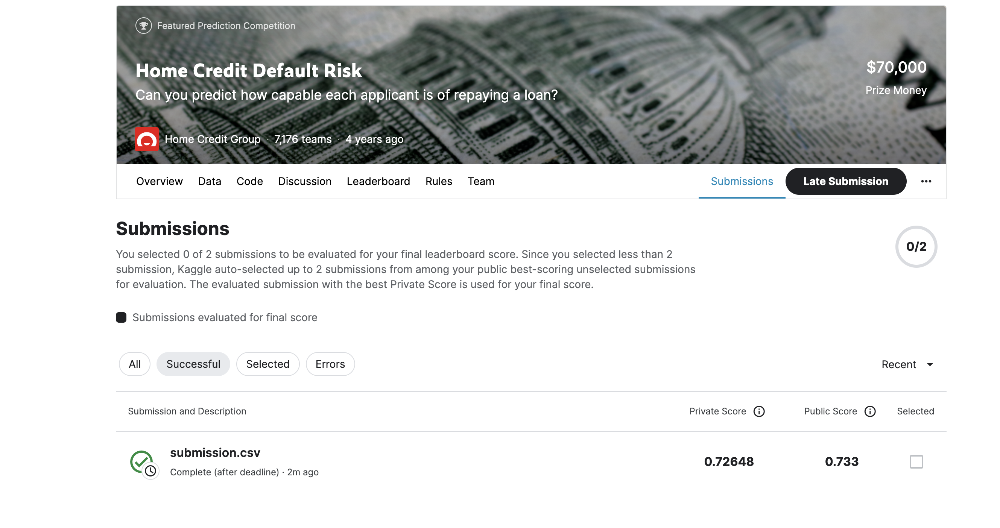

# Write-up 
For this phase of the project, you will need to submit a write-up summarizing the work you did. 
The write-up form is available on Canvas (Modules-> Module 12.1 - Course Project - Home Credit Default Risk (HCDR)-> FP Phase 2 (HCDR) : write-up form ). It has the following sections: 
## Abstract

Our goal was to determine how accurately we can predict a new applicant's ability to pay loans. Our area of focus during his week was high level EDA, feature engineering and building a baseline model for our overall goal. From the EDA, we found skewed distributions, correlations which we will utilizemore during phase 2. After EDA and feature engineering, we created 4 data pipeline for char as well as numerical values,with different features and fed it into logistic regression. From this pipeline, we obtained an ROC score of 73.3 in Kaggle and 91.95% in test accuracy.  


## Introduction
## Feature Engineering and transformers
Please explain the work you conducted on feature engineering and transformers. 
Please include code sections when necessary as well as images or any relevant material.

**Section 3.4**

For feature engineering, first we found 2 skewed attributes from the numerical features and did log transformation on the same. And, we also performed correlation between target variable and predictor variables. In additin, based on null value percentage for variables, we did feature engineering as well. 
Here are the screenshots for correlation and log transoformation.

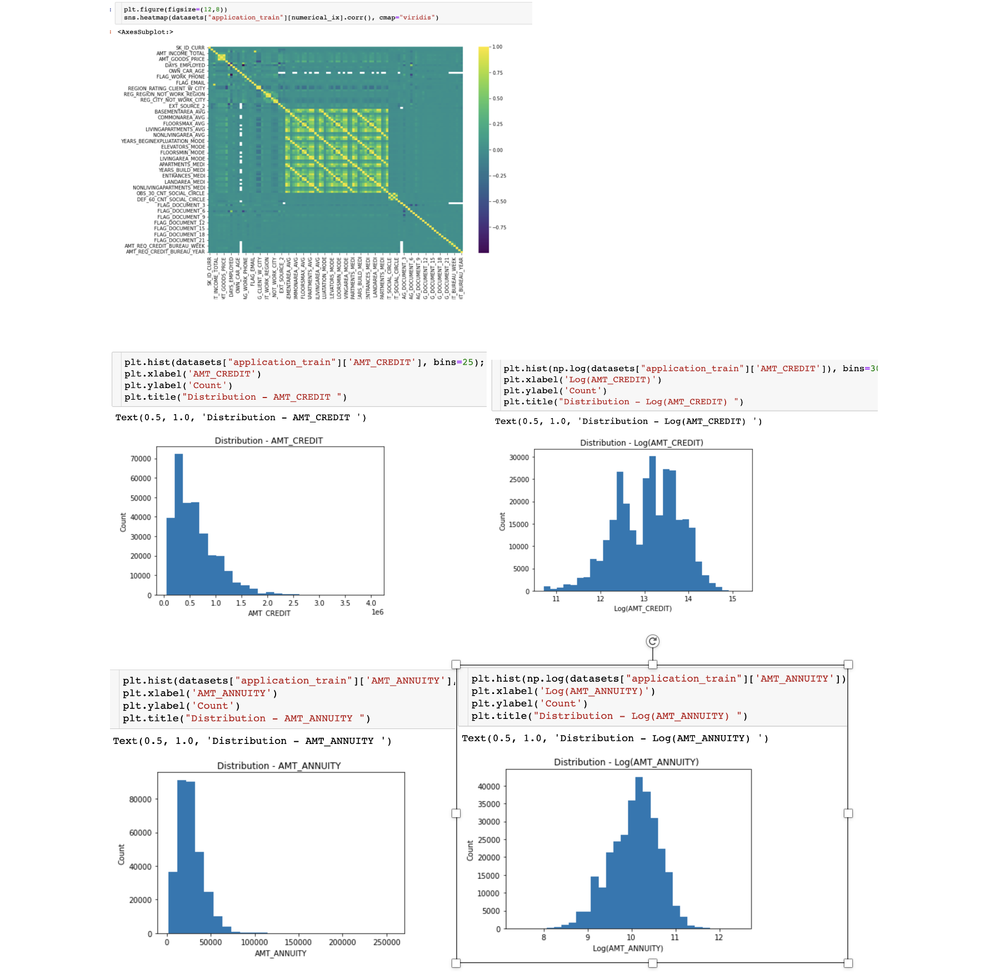
## Pipelines
Please explain the pipelines you created for this project and how you used them
Please include code sections when necessary as well as images or any relevant material

All pipelines are prepared under section 7. 

Our **All Feature** model has all the 120 features (except 'SK_ID_CURR', 'TARGET' )as available in the training set. Then there are 2 set of models where we are selecting the features that we want to use. 1st one, **Baseline with 14 attributes** has 14 attributes, and another one, **Baseline with 79 attributes** has 79 attributes. for model with 14 elements, we used 7 numerical and 7 categorical attributes. For model with 79 attributes, we removed the elements which have more than 50% null values in the the training data. Last model which we used, **Baseline with log features** it has 2 attributes which were log transformed. Apart from that, we used the 79 elements model with it.

Numerical features were standardized using Standard scaler, and we used median to fill in the missing values. As far as categorical data is concerned, We did one hot encoding to standatdize and missing values were filled using the ost frequent values. 

**AUC_ROC score** is used to evaluate our models.

__We have created 3 Logistic regression models:__

    Baseline1_all features 120 raw inputs
    Baseline2_all features 14 inputs
    Baseline3_selected features 79 raw inputs
    Baseline4_selected features 79 raw inputs with a log feature (log AMT_ANNUITY, log AMT_CREDIT)
   
 
 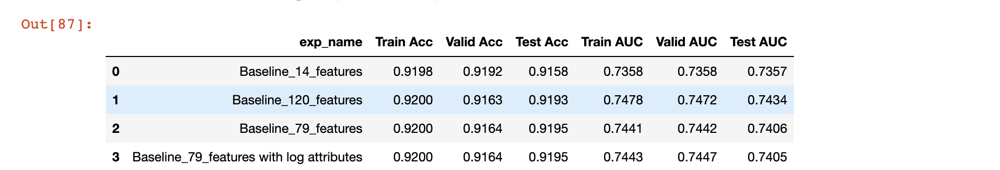
 
 
 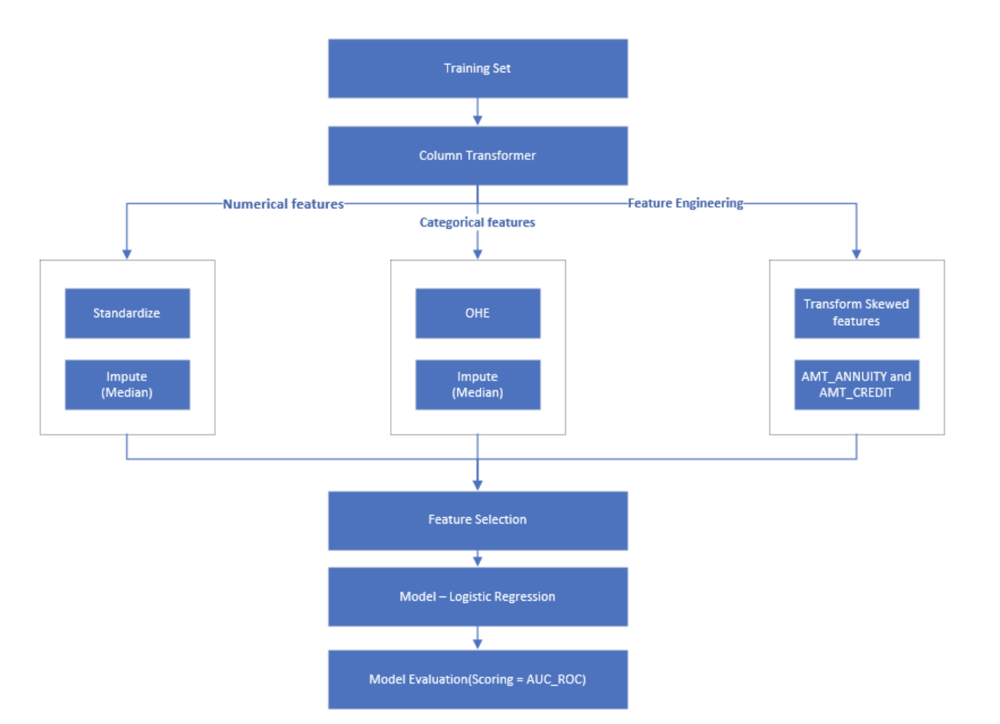
    
## Experimental results
Please present the results of the various experiments that you conducted. The results should be shown in a table or image. Try to include the different details for each experiment.  

Please include code sections when necessary as well as images or any relevant material




 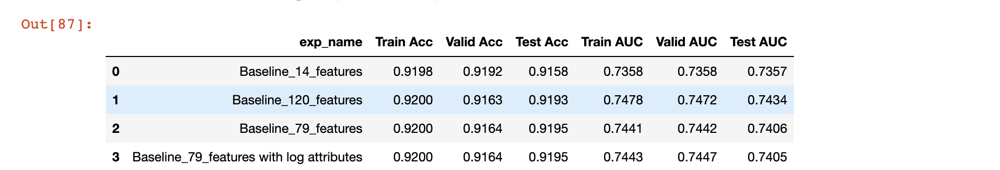

## Discussion

We did 4 experimemts as stated in the picture attached. Except for model with 14 features, 
all other models have training accuracy of 92%. Best validation accuracy was schieved 
for model 3 and 4 and section 7.4 and 7.5. For the scoring, we used AUC score which was 74.34% 
for the model with all attributes.

With more robust feature selection, OHE's, loss functions, and grid paramaters, we think that the score could be improved substantially. We will use our current understanding and inculcalte the learnings and will try to improve our results. 

## Conclusion

In this phase we have understood the dataset by performing EDA where we have checked for the relationship between Target variable and numerical features,categorical features and also checked for the missing values for features.

Upon that, we build 4 pipelines using logistic regression and we have compared all the training and testing accuracies to see which pipeline works best. Our aim in this phase is to achieve best accuracy.

The baseline model with all features has the highest test AUC score in notebook(0.7434) and in Kaggle submission (0.733). We hope for a better score by doing more feature engineering in the next phase.

For the next phase, we will be performing feature engineering on all the data sets to find the important features, perform dimensionality reduction, SVC, and perform feature engineering.

## Kaggle Submission
Please provide a screenshot of your best kaggle submission.   
The screenshot should show the different details of the submission and not just the score.

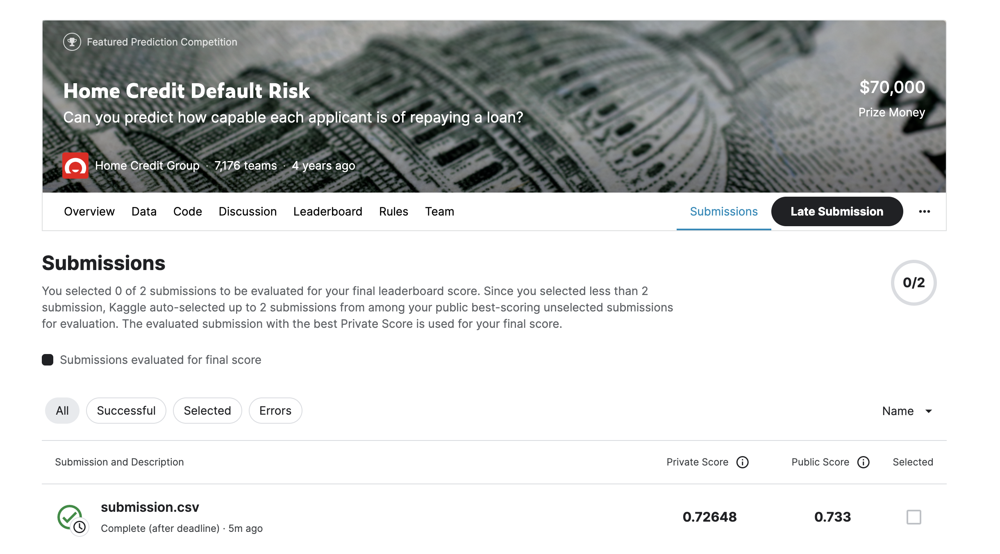

# References

Some of the material in this notebook has been adopted from [here](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/notebook)


#  TODO: Predicting Loan Repayment with Automated Feature Engineering in Featuretools

Read the following:
* feature engineering via Featuretools library: 
  * https://github.com/Featuretools/predict-loan-repayment/blob/master/Automated%20Loan%20Repayment.ipynb
* https://www.analyticsvidhya.com/blog/2018/08/guide-automated-feature-engineering-featuretools-python/
* feature engineering paper: https://dai.lids.mit.edu/wp-content/uploads/2017/10/DSAA_DSM_2015.pdf
* https://www.analyticsvidhya.com/blog/2017/08/catboost-automated-categorical-data/